Multiplexed smFISH on mouse cortex

# Imports

In [1]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pickle
from collections import Counter
import scipy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import networkx 
from networkx.algorithms.components.connected import connected_components
import itertools
from matplotlib.ticker import FuncFormatter
import matplotlib
#import seaborn as sns
from matplotlib import gridspec

plt.rcParams.update({'figure.max_open_warning': 150})

%matplotlib notebook

# Exports

In [485]:
pickle.dump(df_fish_totmol_clean, open( "df_fish_totmol_clean_180220.p", "wb" ))
pickle.dump(coord_df.loc[:,df_fish_totmol_clean.columns], open( "Cell_coordinates.p", "wb" ))
pickle.dump(labels_a, open( "labels_a_df_fish_totmol_clean_180220.p", "wb" ))
pickle.dump(cell_labels, open( "Cell_labels_df_fish_totmol_clean_180220.p", "wb" ))

# Import Data

## smFISH

In [253]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds = loompy.connect(file_name)

#Cell size in dictionary. convert pixels to square um (pixel size = 0.065um)
cell_size = dict(zip(ds.ca.CellID, (np.sqrt(ds.ca.CellArea)*0.065)**2))
cell_size_pix = dict(zip(ds.ca.CellID, ds.ca.CellArea))

In [254]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T

coord_df_full = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df_full

Cell_ID,5800,4993,7318,3147,5340,7528,12,7219,919,3741,...,1826,6265,5272,1920,4005,6724,127,7097,7679,3333
X,23741.863841,18320.966210,31309.341192,9038.052653,16968.698861,29391.515709,2032.897337,29182.037073,7700.957893,15984.049429,...,10798.268585,20490.400929,20112.847727,7789.768557,12969.867899,24000.641429,3869.623199,25254.950430,25144.557627,15563.360344
Y,6919.626474,12357.680415,8773.050262,48228.014329,21298.389644,14054.517366,13402.133528,9827.947791,30781.430652,13636.282537,...,15535.558753,18915.153707,19909.236026,16171.856543,22546.824189,6843.866093,17182.373593,9038.608072,16538.418832,7631.567603


In [498]:
def loompy2data(ds, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `ds`(str): connection to loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """

    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1',
                 'Hybridization9_Lum', 'Hybridization5_Klk6']
    for i in bad_data:
        df.drop(i, inplace=True)
    
    #Filter cell size
    counter1, counter2 = 0, 0
    for i, j in enumerate(ds.col_attrs['CellID']):
        #if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
        if (np.sqrt(ds.col_attrs['CellArea'][i])*0.065)**2 < cutoff_low or (np.sqrt(ds.col_attrs['CellArea'][i])*0.065)**2 > cutoff_high:
            del df[j]
            counter1 +=1
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
                counter2 +=1
        except Exception:
            pass
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2')
    print('counters: size{}, molecules{}'.format(counter1, counter2))
    return df

    
df_fish = loompy2data(ds, 5, 275, 0)

gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp',  'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6','Hybridization12_Kcnip2',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2',
                  'Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2',
 ]

gene_sort = ['Gad2', 'Slc32a1', 'Crhbp',  'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 'Kcnip2',
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2'] 

gene_sort_full = ['Gad2', 'Slc32a1', 'Crhbp',  'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 'Kcnip2',
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Anln', 'Klk6',  
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2', 'Lum']

gene_name_conversion = dict(zip(gene_sort, gene_sort_fish))

print(df_fish.shape)
df_fish = df_fish.loc[gene_sort_fish]
coord_df = coord_df.loc[:,df_fish.columns]

#Exclude the cells in the bleached area
coord_df = coord_df.loc[:, coord_df.loc['X'] < 25000]
#include_cells = coord_df.loc[:, coord_df.loc['X'] < 25000].columns.tolist()
df_fish = df_fish.loc[:, coord_df.columns]
print('Excluded cells from the bleached area')

print('\nFinal shape: {} genes, {} cells'.format(df_fish.shape[0], df_fish.shape[1]))

Selected cells with  5>size<275 and a minimum molecule count of 0 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
counters: size295, molecules0
(33, 6176)
Excluded cells from the bleached area

Final shape: 33 genes, 5328 cells


### Normalization

In [256]:
# normalize data by total number of molecules per cell and per gene.
df_fish_totmol = df_fish.divide(df_fish.sum(axis=1), axis=0) * df_fish.shape[0] #Corrected for total molecules per gene
df_fish_totmol = df_fish_totmol.divide(df_fish_totmol.sum(axis=0), axis=1) * df_fish.shape[1] #Corrected for the total per cell
#Non needed in this dataset but for future use:
df_fish_totmol = df_fish_totmol.fillna(0)


df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,1217,2808,5162,532,3607,3251,2757,1228,1234,4653
Hybridization2_Gad2,54.765172,118.369225,60.369299,72.469181,561.251649,77.628125,137.521811,15.938793,33.183831,114.257908,...,111.167843,0.000000,45.371664,120.229877,92.066208,33.678417,41.301518,52.258747,169.169737,191.355084
Hybridization12_Slc32a1,43.167956,81.640166,111.032455,79.972084,524.073283,0.000000,54.199915,0.000000,91.548575,0.000000,...,0.000000,27.772294,0.000000,55.282314,28.221677,0.000000,227.887798,0.000000,0.000000,0.000000
Hybridization10_Crhbp,84.398123,0.000000,108.540359,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,154.071620,...,0.000000,54.297903,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization13_Cnr1,19.210639,72.663149,98.823510,498.249403,1187.319772,571.841605,289.441096,273.961087,203.705113,70.139340,...,0.000000,98.873994,167.113435,147.610688,627.961696,41.348244,152.122225,0.000000,0.000000,256.291362
Hybridization6_Vip,299.262589,87.072592,118.420675,170.587027,762.198667,228.413492,173.419310,93.796815,48.820158,112.064400,...,0.000000,592.405851,0.000000,648.569458,60.199155,247.738972,425.340475,307.532941,165.922039,51.185857
Hybridization5_Cpne5,0.000000,496.305593,84.373340,60.770627,36.203840,0.000000,164.745630,601.462165,139.135158,0.000000,...,0.000000,0.000000,285.355554,0.000000,428.911913,0.000000,0.000000,0.000000,0.000000,1167.018297
Hybridization8_Pthlh,156.527035,0.000000,0.000000,0.000000,691.014567,0.000000,196.528928,159.444074,0.000000,0.000000,...,0.000000,100.702355,0.000000,0.000000,102.331818,168.451395,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crh,115.468036,0.000000,296.995752,0.000000,191.157301,0.000000,869.861594,117.619899,0.000000,140.527196,...,0.000000,74.286868,167.409491,147.872193,75.488902,124.264487,0.000000,0.000000,416.127850,0.000000
Hybridization1_Tbr1,82.761491,264.880528,458.491664,141.528248,49.183660,379.008439,223.810322,311.275698,67.506418,23.243676,...,90.460235,98.298404,1052.223754,326.114178,216.426097,109.620099,84.020363,0.000000,214.134545,70.777604
Hybridization9_Lamp5,19.676136,471.351141,430.177020,765.483878,0.000000,32.538779,428.212202,293.961374,354.689926,0.000000,...,23.298681,4.219576,38.036177,8.399304,720.359319,35.291801,0.000000,0.000000,7.878841,656.254025


<IPython.core.display.Javascript object>


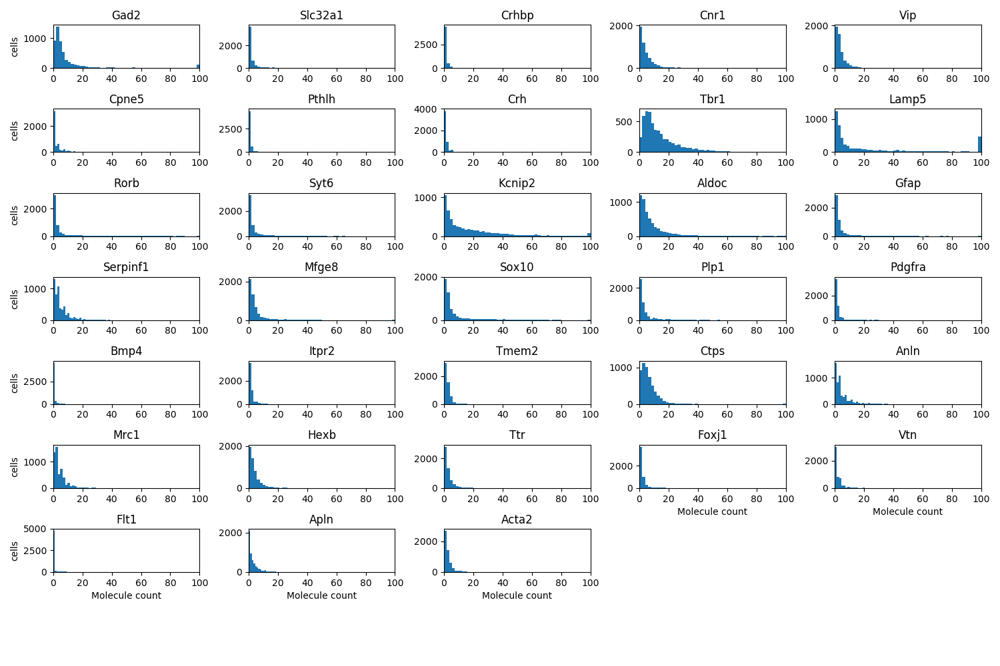

In [6]:
plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8, 5)

for i in range(len(df_fish.index)):
    ax = plt.subplot(gs[i])
    data = np.array(df_fish.iloc[i])
    data = np.clip(data, 0, 100)
    ax.hist(data, bins=50)
    ax.set_title(df_fish.index[i].split('_')[1])
    ax.set_xlim(0,100)
    
    if i in range(len(gene_sort_fish)-5,len(gene_sort_fish)):
        plt.xlabel('Molecule count')
    if i%5 ==0:
        plt.ylabel('cells')
    
plt.tight_layout()

<IPython.core.display.Javascript object>


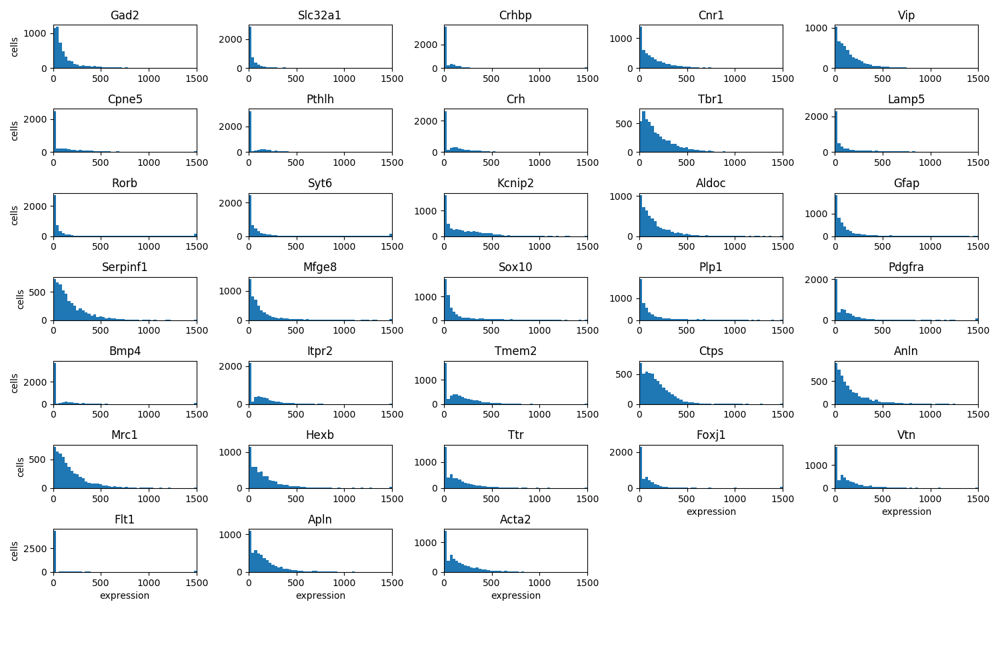

In [7]:
plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8, 5)

for i in range(len(df_fish_totmol.index)):
    ax = plt.subplot(gs[i])
    data = np.array(df_fish_totmol.iloc[i])
    data = np.clip(data, 0, 1500)
    ax.hist(data, bins=50)
    ax.set_title(df_fish.index[i].split('_')[1])
    ax.set_xlim(0,1500)
    
    if i in range(len(gene_sort_fish)-5,len(gene_sort_fish)):
        plt.xlabel('expression')
    if i%5 ==0:
        plt.ylabel('cells')
    
plt.tight_layout()

## Single Cell

In [8]:
# Import the Single Cell Cortex data into a data frame (Zeisel 2015)
df_sc_cort = pd.read_csv('/home/lars/storage/Documents/Single_Cell/Single_Cell_Cortex_Data/expression_mRNA_17-Aug-2014.txt', 
                         sep="\t", index_col=0, low_memory=False)
#used Low_memory=False, because the df is made up of mixed types in the rows. (normaly pandas expects different parameters in the columns)

# Remove all the bad cells (Cells with the label '(none)'
    #This removes 189 bad cells
df_sc_cort = df_sc_cort.loc[:, [i for i in df_sc_cort.columns if df_sc_cort.iloc[8,df_sc_cort.columns.get_loc(i)] != '(none)']].copy()

# Put all cell labels in a dictionary
sc_cor_cell_label_1 = df_sc_cort.iloc[7,1:].to_dict()
sc_cor_cell_label_2 = df_sc_cort.iloc[8,1:].to_dict()

# Get rid of the meta data
df_sc_cort = df_sc_cort.iloc[10:,1:]

#Make a copy with all the genes
df_sc_cort_all_genes = df_sc_cort.copy()
df_sc_cort_all_genes = df_sc_cort_all_genes.astype(int)
# 
df_sc_cort = df_sc_cort.loc[gene_sort,:]
df_sc_cort = df_sc_cort.astype(int)
print(df_sc_cort.shape)

(33, 2816)


In [9]:
#transform the data in the same way as the FISH data
df_sc_totmol = df_sc_cort.divide(df_sc_cort.sum(axis=1), axis=0) * df_sc_cort.shape[0] #Corrected for total molecules per gene
df_sc_totmol = df_sc_totmol.divide(df_sc_totmol.sum(axis=0), axis=1)# * df_sc_cort.shape[1] #Corrected for the total per cell
df_sc_totmol = df_sc_totmol.fillna(0)

df_sc_all_totmol = df_sc_cort_all_genes.divide(df_sc_cort_all_genes.sum(axis=1), axis=0) * df_sc_cort_all_genes.shape[0] #Corrected for total molecules per gene
df_sc_all_totmol = df_sc_all_totmol.fillna(0)
df_sc_all_totmol = df_sc_all_totmol.divide(df_sc_all_totmol.sum(axis=0), axis=1) * df_sc_cort_all_genes.shape[1] #Corrected for the total per cell
df_sc_all_totmol = df_sc_all_totmol.fillna(0)

# Marker selection

In [10]:
#Load the data set with the cortex and oligo paper cells
df_sc_cort_olig = pd.read_pickle('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/df_cortex_olig.pkl')
df_sc_cort_olig = df_sc_cort_olig.loc[gene_sort_full,:]

#Load Cell label dictionary
sc_cort_olig_label = pickle.load(open('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/label_cortex_olig.pkl', "rb" ) )
df_sc_cort_olig.head(5)

,sscortex,sscortex.1,sscortex.2,sscortex.3,sscortex.4,sscortex.5,sscortex.6,ca1hippocampus,sscortex.7,sscortex.8,...,C1-1772078-018-A06,C1-1772099-001-A01,C1-1772089-205-A10,C1-1772089-205-F02,C1-1772117-028-B06,C1-1772089-205-B09,C1-1772063-074-D10,C1-1772089-202-G07,C1-1772089-202-B06,C1-1772117-055-D11
Gad2,23,9,14,19,6,35,79,51,52,91,...,0,1,0,0,0,0,0,0,0,0
Slc32a1,7,12,13,8,13,3,12,9,6,6,...,0,0,0,0,0,0,0,0,0,0
Crhbp,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Cnr1,20,12,122,82,7,40,38,80,10,62,...,0,0,0,0,0,0,0,0,0,0
Vip,416,224,286,359,221,54,531,0,296,151,...,0,0,0,0,0,0,0,0,0,0


In [11]:
df_CO_totmol = df_sc_cort_olig.divide(df_sc_cort_olig.sum(axis=1), axis=0) * df_sc_cort_olig.shape[0]
df_CO_totmol = df_CO_totmol.divide(df_CO_totmol.sum(axis=0), axis=1) * df_CO_totmol.shape[1]
df_CO_totmol = df_CO_totmol.fillna(0)

<IPython.core.display.Javascript object>


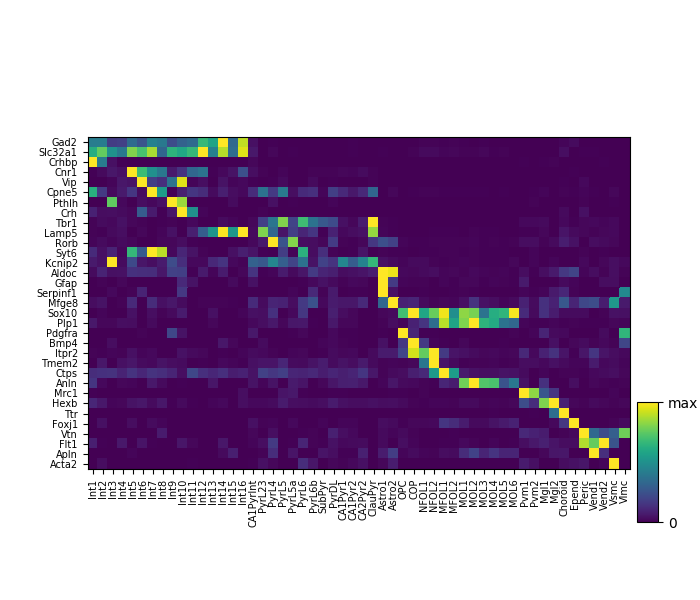

In [12]:
#make list and array of cell type labels
sc_CO_labels = []
for i in df_sc_cort_olig.columns:
    sc_CO_labels.append(sc_cort_olig_label[i])
sc_CO_labels_a = np.array(sc_CO_labels)

#Make df with count averages per cluster
df_count_average_sc = pd.DataFrame(index=df_sc_cort_olig.index, columns=np.unique(sc_CO_labels_a))



for l in np.unique(sc_CO_labels_a):
    #filt = np.sort(sc_CO_labels) == l
    filt = sc_CO_labels_a == l
    mean = np.array(df_sc_cort_olig.loc[:,filt].T.mean())
    #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
    if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
        df_count_average_sc[l] = mean

#df_count_average_sc = df_count_average_sc.loc[gene_sort,:]
        
type_sort_sc_cort = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6', 'S1PyrL6b',
'SubPyr', 'S1PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA2Pyr2','ClauPyr',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'PPR']

type_sort_sc_cort_corrected = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'PyrL23', 'PyrL4', 'PyrL5', 'PyrL5a', 'PyrL6', 'PyrL6b',
'SubPyr', 'PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA2Pyr2','ClauPyr',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',

'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'Vlmc']

df_count_average_sc = df_count_average_sc.loc[gene_sort, type_sort_sc_cort]


fig, ax = plt.subplots(figsize=(7,6))
z = df_count_average_sc.values
z = z/np.percentile(z, 99, 1)[:,None]
im  = ax.pcolor(z,cmap='viridis', vmax=1)

y_pos = np.arange(len(df_count_average_sc.index))
x_pos = np.arange(len(df_count_average_sc.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected, rotation='vertical', fontsize=7) #df_count_average_sc.columns
ax.set_yticks(y_pos+0.5)
ax.set_yticklabels(df_count_average_sc.index, fontsize=7)
ax.invert_yaxis()

ax.set_aspect('equal')


cax = fig.add_axes([.91, 0.13, 0.03, 0.2])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', 'max'])


#plt.savefig('Marker_selection.svg')

<IPython.core.display.Javascript object>


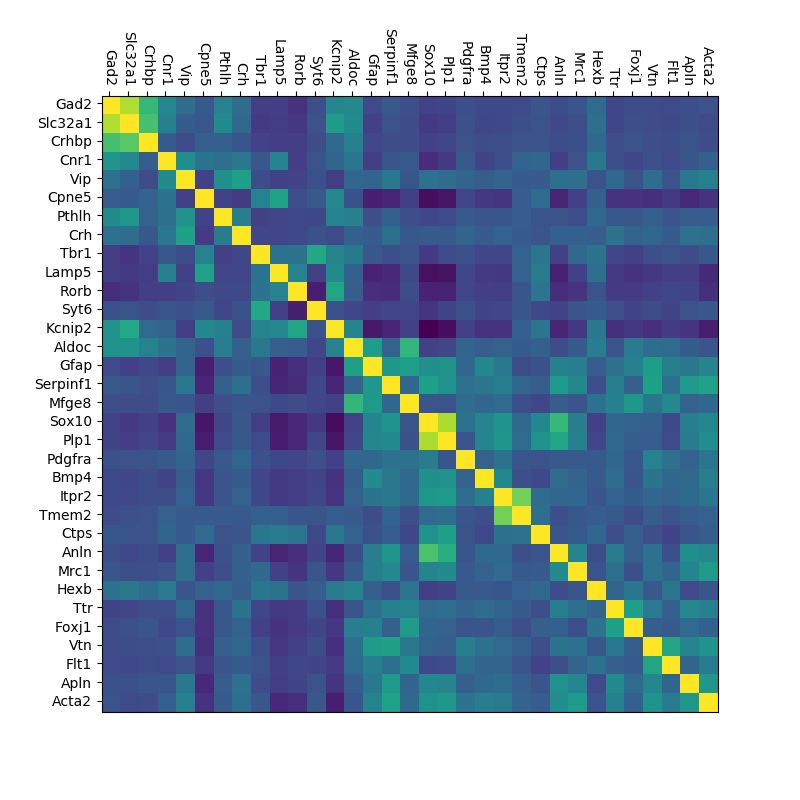

In [13]:
def correlation_df(df):
    fig, ax = plt.subplots(figsize=(8,8))
    data = df.T.corr(method='pearson').values
    data = data/np.percentile(data, 99, 1)[:,None]
    #axHM.pcolor(z,cmap='viridis', vmax=1)
    
    ax.pcolor(data,cmap='viridis', vmax=1 )

    y_pos = np.arange(len(df))
    x_pos = np.arange(len(df))
    #ax1.set_xlim(0, len(df_count_average.columns))
    ax.xaxis.tick_top()
    ax.set_xticks(x_pos+0.4)
    ax.set_xticklabels(gene_sort, rotation=-90)
    ax.set_yticks(y_pos+0.4)
    ax.set_yticklabels(gene_sort)
    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.set_title('')

correlation_df(df_fish)

# Gene expression FISH

<IPython.core.display.Javascript object>


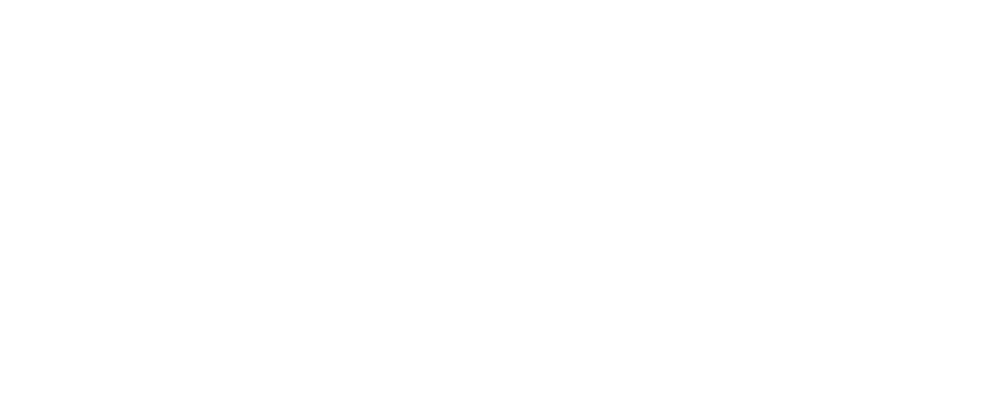

NameError: name 'sns' is not defined

In [437]:
plt.figure(figsize=(10,4))
data = [[df_fish.loc[i].values] for i in df_fish.index]
#data = [l[l != 0] for l in data]
gene_colors =   ['#d40d79', '#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79',
        '#07a2d5','#07a2d5','#07a2d5','#07a2d5','#07a2d5',
        '#f1880b','#f1880b','#f1880b','#f1880b',
        '#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33',
        '#950cae', '#11c48f',
        '#0c644a', '#ffde00',
        '#cbeb1c', '#fa2e2b', '#fa2e2b', '#fa2e2b']

#From: https://stackoverflow.com/questions/29643352/converting-hex-to-rgb-value-in-python
gene_colors_rgb = [list((int(c.lstrip('#')[i:i+2], 16)/255) for i in (0, 2 ,4)) for c in gene_colors]

sns.set_style('white')
sns.violinplot(data=data, palette=gene_colors_rgb, bw=0.2, cut=0, linewidth=1, scale="width", spines='left')
sns.despine()
ax = plt.gca()
ax.set_yscale('log')
x_pos = np.arange(df_fish.shape[0])
ax.set_xticks(x_pos)
labels = [i.split('_')[1] for i in df_fish.index]
ax.set_xticklabels(labels, rotation='vertical', fontsize=10)
ax.set_ylabel('Molecule count')
plt.tight_layout()
#plt.savefig('Count_distribution_smFISH.svg')

# Comparison smFISH & Single Cell

## Counts

In [438]:
#Zeros fish
print('In smFISH {}% of the values are a zero'.format(Counter(df_fish.values.flat)[0] / (df_fish.shape[0] *df_fish.shape[1]) * 100))

#Zeros single cell
print('In single cell RNA-seq {}% of the values are a zero'.format(Counter(df_sc_cort.values.flat)[0] / (df_sc_cort.shape[0] *df_sc_cort.shape[1]) * 100))

In smFISH 30.406542906542906% of the values are a zero
In single cell RNA-seq 82.45738636363636% of the values are a zero


In [439]:
print('on average the cells had {} molecules with a std of {} '.format(np.average(df_fish.sum()), np.std(df_fish.sum())))

on average the cells had 182.33746246246247 molecules with a std of 107.42768994320733 


In [441]:
np.std(df_fish.sum()) / np.sqrt(df_fish_totmol.shape[1])

1.4717502862681

In [442]:
difference_sc_fish = np.zeros((len(gene_sort_fish),3))
for i, g in enumerate(gene_sort_fish):
    difference_sc_fish[i,0] = np.mean(df_fish.loc[g])
    difference_sc_fish[i,1] = np.mean(df_sc_cort.loc[g.split('_')[1]])
    difference_sc_fish[i,2] = (np.mean(df_fish.loc[g]) / np.mean(df_sc_cort.loc[g.split('_')[1]]))

<IPython.core.display.Javascript object>


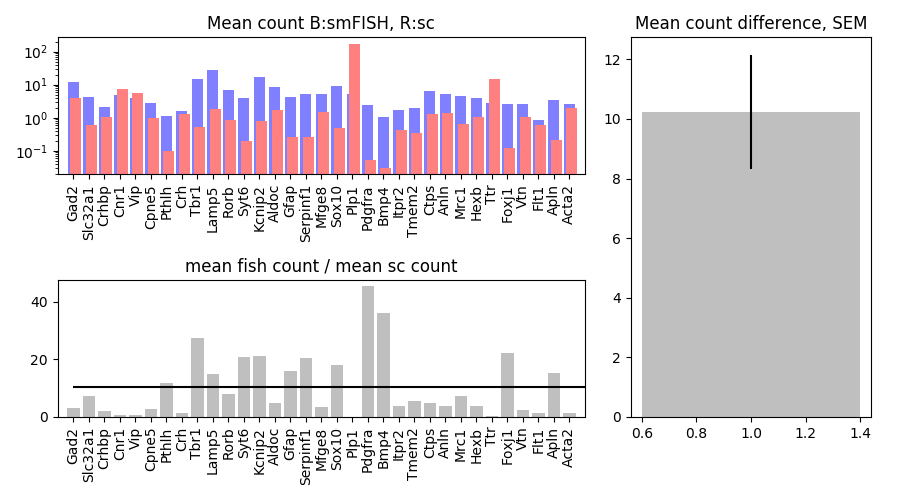

The mean count is on average 10.22646700563957 times higher for the smFISH compated to the single cell, with a std of 10.94786685965255 and a SEM of 1.9057790006433826
Assumes unbiased cell sampling


In [443]:
plt.figure(figsize=(9, 5))
ax1 = plt.subplot2grid((2,3), (0,0), rowspan=1, colspan=2)
x_pos = list(range(difference_sc_fish.shape[0]))
ax1.bar(x_pos, difference_sc_fish[:,0], color='b', alpha=0.5, linewidth=0, width=0.7)
ax1.bar([x+0.15 for x in x_pos], difference_sc_fish[:,1],  alpha=1, linewidth=0, width=0.7, color=[255/255,128/255,128/255])
ax1.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax1.set_xticklabels(gene_sort, rotation='vertical');
ax1.set_yscale("log")
ax1.set_xlim(-1, len(gene_sort))
ax1.set_title('Mean count B:smFISH, R:sc')

ax2 = plt.subplot2grid((2,3), (1,0), rowspan=1, colspan=2)
ax2.bar(x_pos, difference_sc_fish[:,2], color='grey', alpha=0.5)
ax2.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax2.set_xticklabels(gene_sort, rotation='vertical');
ax2.set_title('mean fish count / mean sc count')
ax2.hlines(np.mean(difference_sc_fish[:,2]), 0, 35)
ax2.set_xlim(-1, len(gene_sort))

ax3 = plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
ax3.bar(1,np.mean(difference_sc_fish[:,2]), yerr = np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0]), color='grey', alpha=0.5, ecolor='black')
ax3.set_title('Mean count difference, SEM')
plt.tight_layout()

print('The mean count is on average {} times higher for the smFISH compated to the single cell, with a std of {} and a SEM of {}'.format(
    np.mean(difference_sc_fish[:,2]), np.std(difference_sc_fish[:,2]) ,np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0])))
print('Assumes unbiased cell sampling')

<IPython.core.display.Javascript object>


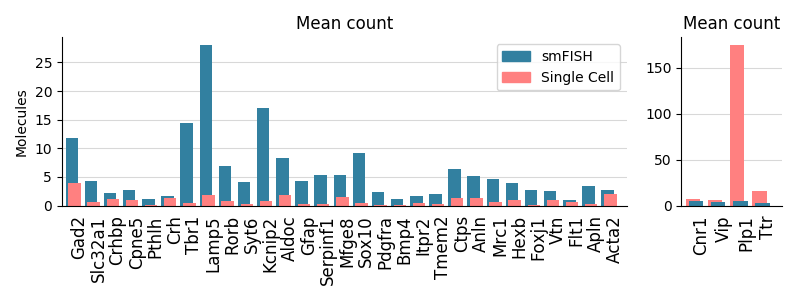

In [445]:
difference_sc_fish = pd.DataFrame(data = np.zeros((len(gene_sort_fish),5)), 
                                  index=gene_sort_fish, columns=['mean_fish', 'f_std', 'mean_sc','s_std', 'f/s'])

for g in gene_sort_fish:
    difference_sc_fish.loc[g] = [np.mean(df_fish.loc[g]), np.std(df_fish.loc[g]),
                                 np.mean(df_sc_cort.loc[g.split('_')[1]]), np.std(df_sc_cort.loc[g.split('_')[1]]), 
                                 (np.mean(df_fish.loc[g]) / np.mean(df_sc_cort.loc[g.split('_')[1]]))]

fish_h =[]
sc_h = []
for n, i in enumerate(difference_sc_fish.index):
    if difference_sc_fish.iloc[n,4] > 1:
        fish_h.append(i)
    else:
        sc_h.append(i)

fig= plt.figure (figsize=(8,3))

ax1 = plt.subplot2grid((1,5), (0,0), rowspan=1, colspan=4)
x_pos = np.array(range(difference_sc_fish.loc[fish_h].shape[0]))
ax1.bar(x_pos+0.01, difference_sc_fish.loc[fish_h].iloc[:,0], alpha=1, linewidth=0, width=0.65, color='#3280a0')
ax1.bar(x_pos+0.15, difference_sc_fish.loc[fish_h].iloc[:,2],  alpha=1, linewidth=0, width=0.65, color=[255/255,128/255,128/255])
#ax1.set_yscale("log")
ax1.set_xticks(np.arange(len(gene_sort))+0.4)
genes = []
for i in difference_sc_fish.loc[fish_h].index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
ax1.set_xticklabels(genes, rotation='vertical', fontsize=12)
ax1.set_xlim(-0.5, len(genes))

#ax1.yaxis.set_major_formatter(FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax1.set_axisbelow(True)
ax1.yaxis.grid(color='gray', linestyle='solid', alpha=0.3)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.yaxis.set_ticks_position('left')
ax1.xaxis.set_ticks_position('none')
ax1.set_ylabel('Molecules')
ax1.set_title('Mean count')


ax2 = plt.subplot2grid((1,5), (0,4), rowspan=1, colspan=1)
x_pos = np.array(range(difference_sc_fish.loc[sc_h].shape[0]))
ax2.bar(x_pos+0.01, difference_sc_fish.loc[sc_h].iloc[:,2],  alpha=1, linewidth=0, width=0.65, color=[255/255,128/255,128/255])
ax2.bar(x_pos+0.15, difference_sc_fish.loc[sc_h].iloc[:,0], alpha=1, linewidth=0, width=0.65, color='#3280a0')

#ax1.set_yscale("log")
ax2.set_xticks(np.arange(len(gene_sort))+0.4)
genes = []
for i in difference_sc_fish.loc[sc_h].index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
ax2.set_xticklabels(genes, rotation='vertical', fontsize=12)
ax2.set_xlim(-0.5, len(genes))

#ax1.yaxis.set_major_formatter(FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax2.set_axisbelow(True)
ax2.yaxis.grid(color='gray', linestyle='solid', alpha=0.3)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.yaxis.set_ticks_position('left')
ax2.xaxis.set_ticks_position('none')
ax2.set_title('Mean count')

blue_patch = matplotlib.patches.Patch(color='#3280a0', label='smFISH')
red_patch = matplotlib.patches.Patch(color=[255/255,128/255,128/255], label='Single Cell')
plt.sca(ax1)
plt.legend(handles=[blue_patch, red_patch], loc=0)

plt.tight_layout()

plt.savefig('Comparison_smFISH_sc_180220.pdf')

In [ ]:
plt.figure()

df = difference_sc_fish.loc[['Hybridization1_Foxj1','Hybridization2_Gfap','Hybridization3_Mfge8','Hybridization5_Cpne5', 
            'Hybridization6_Itpr2','Hybridization7_Ctps','Hybridization8_Pdgfra','Hybridization9_Lamp5','Hybridization10_Crh',
            'Hybridization11_Syt6','Hybridization12_Kcnip2','Hybridization13_Cnr1',
                             
            'Hybridization1_Aldoc','Hybridization2_Flt1','Hybridization3_Hexb',
              'Hybridization6_Bmp4','Hybridization7_Rorb','Hybridization8_Pthlh','Hybridization10_Crhbp',
              'Hybridization11_Tmem2','Hybridization12_Slc32a1','Hybridization13_Plp1',
                             
            'Hybridization1_Tbr1','Hybridization2_Gad2','Hybridization3_Mrc1','Hybridization5_Acta2',
            'Hybridization6_Vip','Hybridization7_Sox10','Hybridization8_Serpinf1','Hybridization9_Anln','Hybridization10_Apln',
            'Hybridization12_Vtn','Hybridization13_Ttr'],:]

plt.bar(np.arange(df.shape[0]), df.loc[:,'f/s'])

plt.gca().set_xticks(np.arange(len(gene_sort)))
genes = []
for i in df.index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
plt.gca().set_xticklabels(genes, rotation='vertical', fontsize=6);
plt.ylabel('Fold efficiency')
plt.title('fish/single cell Sorted on Channel')
#plt.savefig('fish-div-single-cell mean expression, sort channel.png', dpi=600)

In [ ]:
gene_50nt = {
    'Hybridization2_Gad2': "tccctaaaaa tctcttgggc cctttccact ttccaatctc cagactgcga",
    'Hybridization12_Slc32a1': "caccgacctc ccaggggtgc acctctccag cctcggtcgc gcttccgaaa",
    'Hybridization10_Crhbp': "aaggggcaga gagcctcccc tctactgctc tataaaagag acccagcaaa",
    'Hybridization13_Cnr1': "cgatggacta acggattaga agaattctcc tagctctgag agaatcccta",
    'Hybridization6_Vip': "agcttggaca gcagagcact agccagctac agccaaccgt tccccaggaa",
    'Hybridization5_Cpne5': "cccagggctg cagccgctcc ggaggaggcg tgaatcgcgc aggaatattg",
    'Hybridization8_Pthlh': "gcggccacct ggccctcgca tccacgacac gcgcgcctgc aacttgttca",
    'Hybridization10_Crh': "aggcaaatgc tgcgtgcttt ctgaagaggg tcgacattat aaaatctcac",
    'Hybridization1_Tbr1': "cagctaacca atggcaagag ccgtttcatc ggctgcataa gcagcaagat",
    'Hybridization9_Lamp5': "ggagctgaat ggcacttggg acagtttcct tgagaactct cagcgtggac",
    'Hybridization7_Rorb': "acctctctcc tctttctctc tcgctccctt cgtctctgca actgaacagt",
    'Hybridization11_Syt6': "gaagtgatta aaagcagagc ggagcctcag ggggccgctg cggggagggt",
    'Hybridization12_Kcnip2': "ctgggctcag gctcggctct cagctccacg ctgccttctg ctccgctctc",
    'Hybridization1_Aldoc': "gaggtatctg tcacgccccc agggagtcac gtagctctgc ggcaagtgct",
    'Hybridization2_Gfap': "ccaggaagtc aggggcagat ttagtccaac ccgttcctcc ataaaggccc",
    'Hybridization8_Serpinf1': "gtcactttaa gaaaagagta gctgtaatct gaagcctgct ggacgctggt",
    'Hybridization3_Mfge8': "ggcgcctgat ttattccgga gtgagaggag cggacgcagg aactctcgag",
    'Hybridization7_Sox10': "caggactggg tctcctttcc agggagagga agagcccttc atggaaccgt",
    'Hybridization13_Plp1': "aatcagaaag cccttttcat tgcaggagaa gaggacaaag atactcagag",
    'Hybridization8_Pdgfra': "cagctattta ctttaagcaa atgattagtt tttggaggac ggactataac",
    'Hybridization6_Bmp4': "ggaggagggaagaagggaggggccgctggggggaaagactggggaggaag",
    'Hybridization6_Itpr2': "ggcttctccc cgccctctcg gtccgtgggc accgccacct ggtctaaaga",
    'Hybridization11_Tmem2': "cactctcggc ccagccgagc cggcgcttgt gtggccggag gctgattaga",
    'Hybridization7_Ctps': "gcctagagcc cgcctctcag aaagacggct ggcgcatgcg gcccggccga",
    'Hybridization9_Anln': "gtgtcgtccg gggcgctgaa attcaaattt tgaacggccg tggtagccta",
    'Hybridization3_Mrc1': "gaccttggac tgagcaaagg ggcaacctgg ggacctggtt gtattctttg",
    'Hybridization3_Hexb': "atctgacttg gtgacccggg cacggatgct ttcttcccag cgacccagac",
    'Hybridization13_Ttr': "ctaatctccc taggcaaggt tcatatttgt gtaggttact tattctcctt",
    'Hybridization1_Foxj1': "agagaagcgc cgtcgggcga gggggggggg cgcgaagagg ggcgccagca",
    'Hybridization12_Vtn': "gggttttctg tttcccagct ctcctggggc tggggttctg ggaatgtgac",
    'Hybridization2_Flt1': "agcgcggtgg cggacactcc cgggaggtag tgctagtggt ggtggctgct",
    'Hybridization10_Apln': "ggaagcattc tctctaacag cctggaccaa cgggtagttg ggagtcgcgg",
    'Hybridization5_Acta2': "caaggggcta tataaccctt cagcgttcag cctcccggga caccacccac"}

In [ ]:
gc_content = {}
repeats_seq = {}
for g in gene_50nt:
    gene_50nt[g] = gene_50nt[g].replace(' ', '')
    gc_content[g] = ((Counter(gene_50nt[g])['c'] + Counter(gene_50nt[g])['g'])/len(gene_50nt[g])) * 100
    
    count=0
    goi = gene_50nt[g]
    for n, i in enumerate(goi[1:]):
        if i == goi[n-1]:
            count+= 1
    repeats_seq[g] =  count

In [ ]:
plt.figure()
plt.scatter([gc_content[i] for i in difference_sc_fish.index], difference_sc_fish.loc[:,'f/s'])

plt.ylabel('Fold efficiency')
plt.xlabel('% GC content')
plt.title('fish/single cell Sorted on GC content')
plt.savefig('fish-div-single-cell mean expression, sort GC content.png', dpi=600)

In [ ]:
plt.figure()

plt.scatter([repeats_seq[i] for i in difference_sc_fish.index], difference_sc_fish.loc[:,'f/s'])

plt.ylabel('Fold efficiency')
plt.xlabel('Repeats in first 50nt')
plt.title('fish/single cell Sorted on repeat content')
plt.savefig('fish-div-single-cell mean expression, sort repeat content.png', dpi=600)

## tSNE comparison

In [ ]:
pc_cl = PCA.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_clean = model.fit_transform(pc_cl[:,:31])
scatter_tSNE(tSNE_points_clean, save=True, name='tSNE_smFISH_totmol_clean')
#pickle.dump(tSNE_points_clean, open( "tSNE_points_df_tot-mol-clean_5028cells_p50_ea15.p", "wb" ))

# tSNE

In [334]:
def scatter_tSNE(tSNE_data, save=False, name=None):
    
    f = plt.figure(figsize=(4, 4))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=6, alpha = 0.8, c = '#667e82')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    ax.set_axis_off()
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)
    
    return f, ax, sc

In [ ]:
# Load pre-existing tSNE data
tSNE_points_clean = pickle.load(open( "tSNE_points_df_tot-mol-clean_5028cells_p50_ea15.p", "rb" ))
df_tSNE_points_clean = pd.DataFrame(data= tSNE_points_clean.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)
#df_tSNE_points_clean = df_tSNE_points_clean.loc[:,df_fish_totmol_clean.columns]

In [ ]:
scatter_tSNE(tSNE_points_clean)

<IPython.core.display.Javascript object>


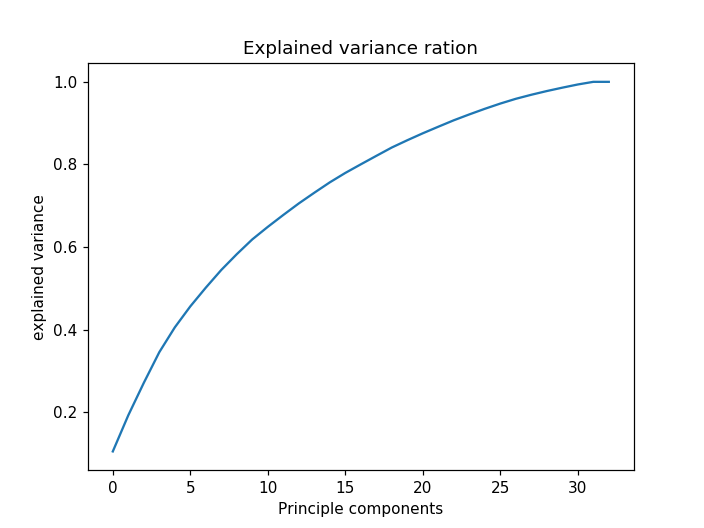

In [336]:
pca = PCA()
pc = pca.fit_transform(df_fish_totmol_clean.T)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

## Try out tSNE settings, Result: tSNE 11

<IPython.core.display.Javascript object>


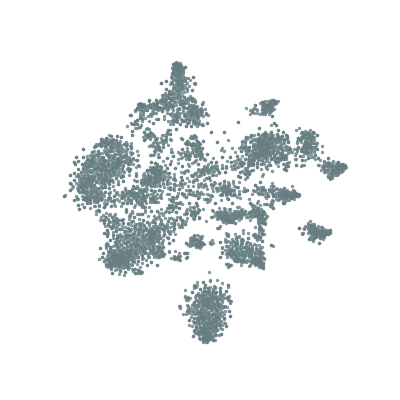

In [358]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=60, early_exaggeration=15)
    #Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points)
#pickle.dump(tSNE_points, open( "tSNE_points_df_tot_mol_4839cells_p60_ea15_20180219.p", "wb" ))
df_tSNE_points = pd.DataFrame(data= tSNE_points.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


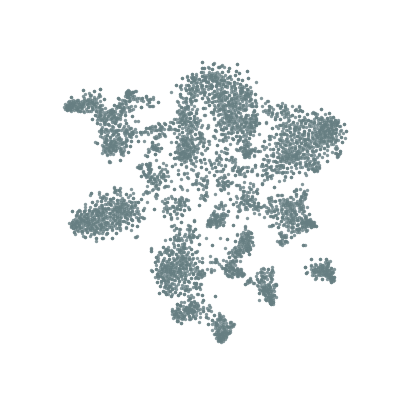

In [359]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points2 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points2)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points2 = pd.DataFrame(data= tSNE_points2.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


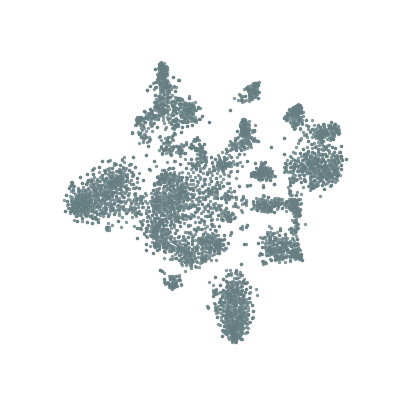

In [360]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=60, early_exaggeration=20)
    #Transpose the data to work on the cells
tSNE_points3 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points3)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points3 = pd.DataFrame(data= tSNE_points3.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


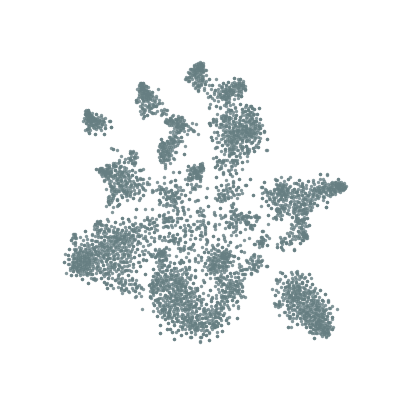

In [361]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points4 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points4)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points4 = pd.DataFrame(data= tSNE_points4.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


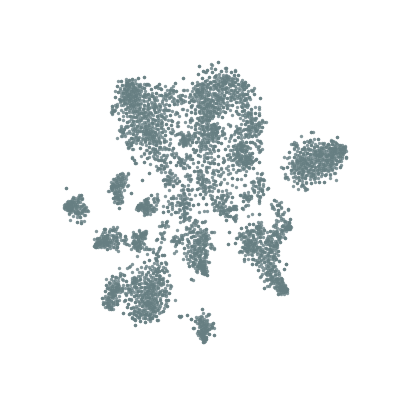

In [362]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=60, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points5 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points5)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points5 = pd.DataFrame(data= tSNE_points5.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


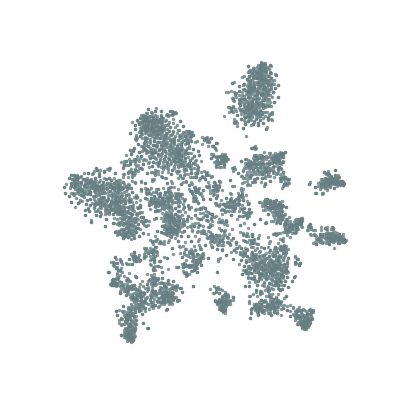

In [363]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
    #Transpose the data to work on the cells
tSNE_points6 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points6)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points6 = pd.DataFrame(data= tSNE_points6.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


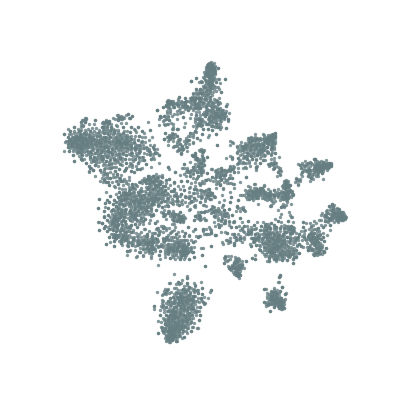

In [364]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=80, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points7 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points7)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points7 = pd.DataFrame(data= tSNE_points7.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


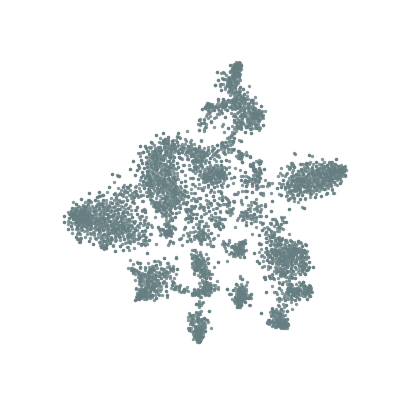

In [365]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=80, early_exaggeration=20)
    #Transpose the data to work on the cells
tSNE_points8 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points8)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points8 = pd.DataFrame(data= tSNE_points8.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


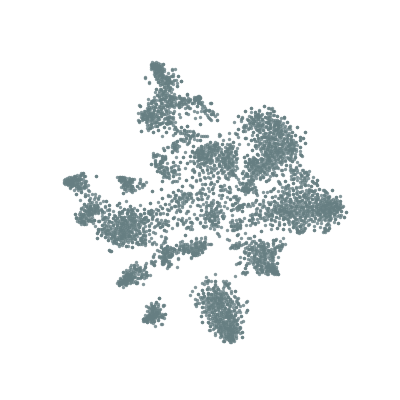

In [366]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points9 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points9)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points9 = pd.DataFrame(data= tSNE_points9.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


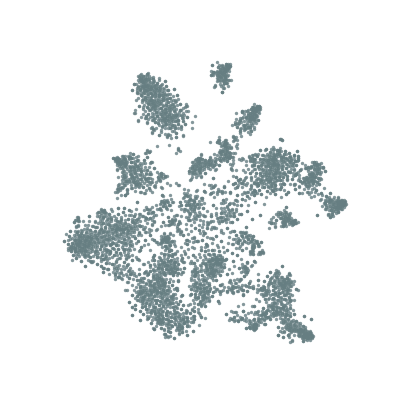

In [367]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points10 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points10)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points10 = pd.DataFrame(data= tSNE_points10.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


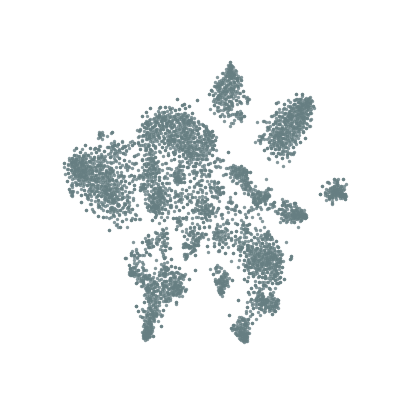

In [391]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=5)
    #Transpose the data to work on the cells
tSNE_points12 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points12)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points12 = pd.DataFrame(data= tSNE_points12.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


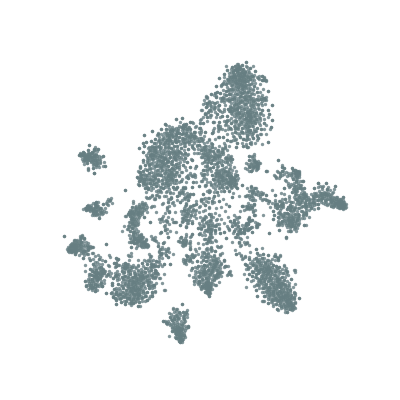

In [392]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=60, early_exaggeration=5)
    #Transpose the data to work on the cells
tSNE_points13 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points13)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points13 = pd.DataFrame(data= tSNE_points13.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


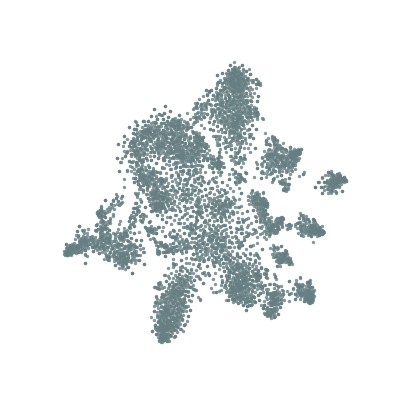

In [393]:
pc = pca.fit_transform(df_fish_totmol.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points14 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points14)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points14 = pd.DataFrame(data= tSNE_points14.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol.columns)

<IPython.core.display.Javascript object>


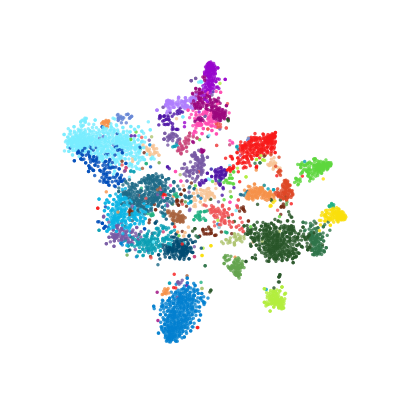

In [377]:
plot_tSNE_clusters(df_fish_totmol_clean, df_tSNE_points7, labels_a)

<IPython.core.display.Javascript object>


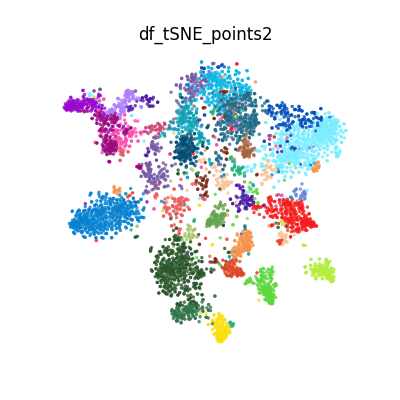

<IPython.core.display.Javascript object>


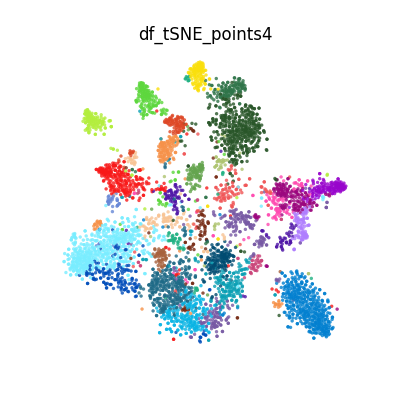

<IPython.core.display.Javascript object>


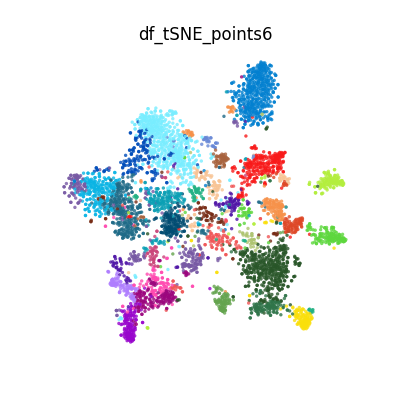

<IPython.core.display.Javascript object>


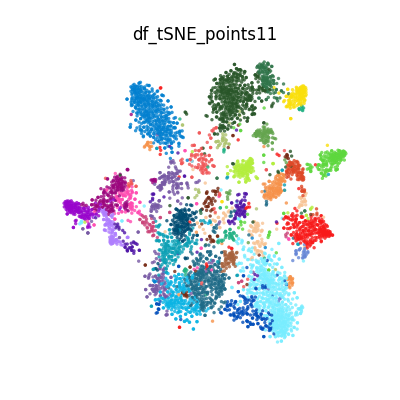

In [403]:
selection = ['df_tSNE_points2','df_tSNE_points4','df_tSNE_points6','df_tSNE_points11',]

#for i in [k for k in locals().keys() if k.startswith('df_tSNE')]:
for i in selection:
    plot_tSNE_clusters(df_fish_totmol_clean, locals()[i], labels_a)
    plt.title(i)

<IPython.core.display.Javascript object>


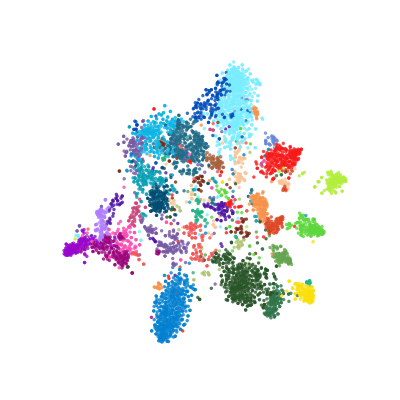

In [399]:
plot_tSNE_clusters(df_fish_totmol_clean, df_tSNE_points14.loc[:,df_fish_totmol_clean.columns], labels_a)

In [ ]:
#pc_cl = pca.fit_transform(df_fish_totmol_clean.T)
#model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
#tSNE_points_clean = model.fit_transform(pc_cl[:,:31])
scatter_tSNE(tSNE_points_clean, save=True, name='tSNE_smFISH_totmol_clean')
#pickle.dump(tSNE_points_clean, open( "tSNE_points_df_tot-mol-clean_5028cells_p50_ea15.p", "wb" ))
#df_tSNE_points_clean = pd.DataFrame(data= tSNE_points_clean.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

## tSNE 11

<IPython.core.display.Javascript object>


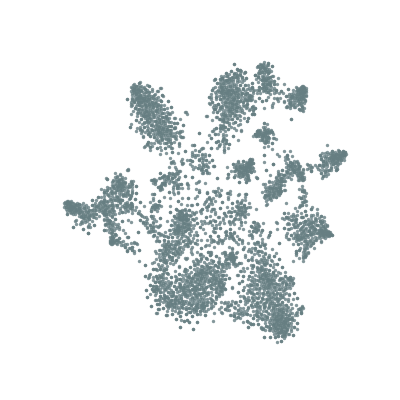

In [368]:
pc = pca.fit_transform(df_fish_totmol_clean.T)
model = TSNE(n_iter=5000, perplexity=70, early_exaggeration=10)
    #Transpose the data to work on the cells
tSNE_points11 = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points11)
#pickle.dump(tSNE_points2, open( "tSNE_points_df_tot_mol_4839cells_p50_ea10_20180219.p", "wb" ))
df_tSNE_points11 = pd.DataFrame(data= tSNE_points11.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

In [406]:
pickle.dump(tSNE_points11, open( "tSNE_points_df_tot_mol_4839cells_p70_ea10_20180220.p", "wb" ))
tSNE_points = tSNE_points11
df_tSNE_points = df_tSNE_points11

<IPython.core.display.Javascript object>


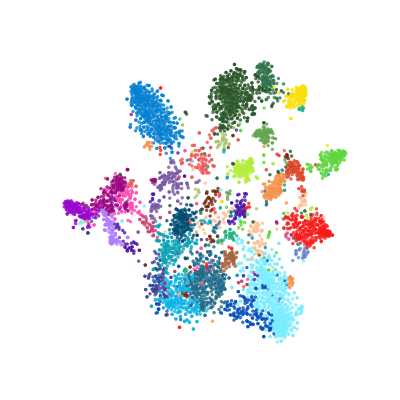

In [418]:
plot_tSNE_clusters(df_fish_totmol_clean, df_tSNE_points, labels_a, save=True, name='tSNE_totmol_clean_180220.png')

## tSNE Comparison

### Single Cell all genes

In [ ]:
pca = PCA()
pc_sc_all = pca.fit_transform(df_sc_all_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_all = model.fit_transform(pc_sc_all[:,:31])
scatter_tSNE(tSNE_points_sc_all, save=True, name='tSNE_single-cell_all-genes')
pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_all-genes_31pc_p50_ea15.p", "wb" ))
#df_tSNE_points_clean = pd.DataFrame(data= tSNE_points_clean.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

In [ ]:
pca = PCA()
pc_sc_all = pca.fit_transform(df_sc_all_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_all = model.fit_transform(pc_sc_all[:,:2800])
scatter_tSNE(tSNE_points_sc_all, save=True, name='tSNE_single-cell_all-genes')
pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_all-genes_31pc_p50_ea15.p", "wb" ))

### Single Cell 33 genes

In [ ]:
pca = PCA()
pc_sc_33 = pca.fit_transform(df_sc_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ratio')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_33 = model.fit_transform(pc_sc_33[:,:31])
scatter_tSNE(tSNE_points_sc_33, save=True, name='tSNE_single-cell_33-genes')
#pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_33-genes_31pc_p50_ea15.p", "wb" ))

## tSNE Expression

<IPython.core.display.Javascript object>


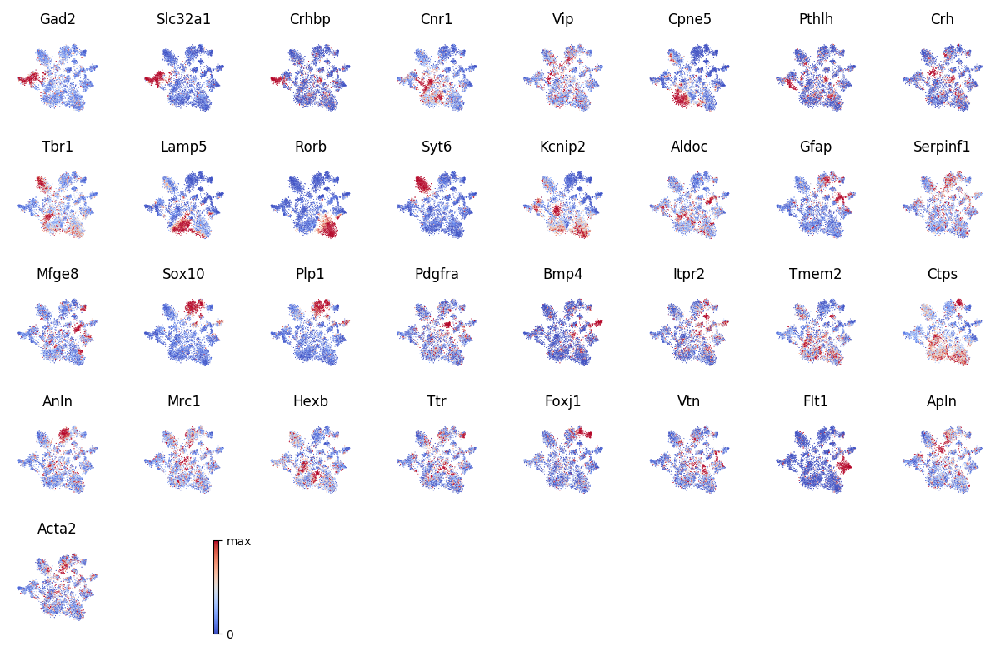

In [447]:
#Expression plot on tSNE points
def plot_tSNE_Expression(df_tSNE, df, save=False, name=None):
    fig = plt.figure(figsize=(12,8))
    gs = plt.GridSpec(5,8)

    for i, gene in enumerate(df.index):
        plt.subplot(gs[i])
        filt = df_fish.index == gene
        levels = df.loc[filt,:].values.flat[:]
        levels = np.clip(levels, np.percentile(levels, 0), np.percentile(levels,90))
        im = plt.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=.99,s=.5)
        
        
        
        for label in plt.gca().axes.get_xticklabels():
            label.set_visible(False)
        for label in plt.gca().axes.get_yticklabels():
            label.set_visible(False)
        plt.title(gene.split('_')[1])
        plt.gca().set_axis_off()
        plt.gca().axis('equal')
    
    plt.subplot(gs[i+1])
    plt.gca().set_axis_off()
    plt.tight_layout()
    m = matplotlib.cm.ScalarMappable(cmap = matplotlib.cm.coolwarm)
    m.set_array(levels)
    colorbar = fig.colorbar(m, ticks=[0, max(levels)])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)
    
plot_tSNE_Expression(df_tSNE_points, df_fish_totmol_clean, save=True, name='tSNE_gene_expression_TL')

## tSNE and spatial expression

<IPython.core.display.Javascript object>


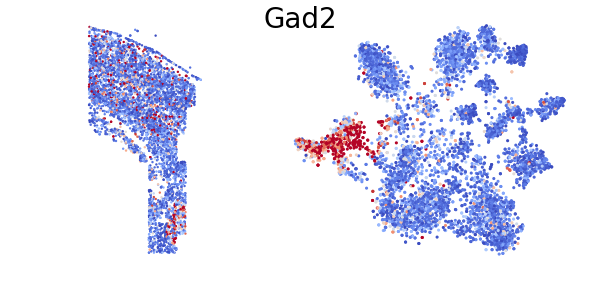

<IPython.core.display.Javascript object>


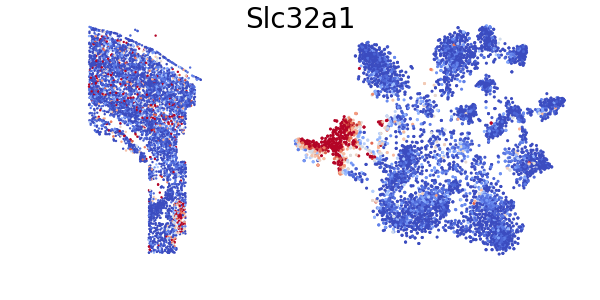

<IPython.core.display.Javascript object>


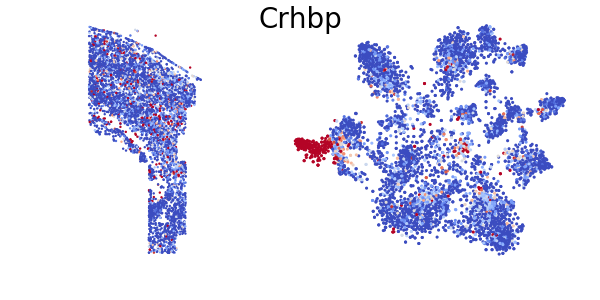

<IPython.core.display.Javascript object>


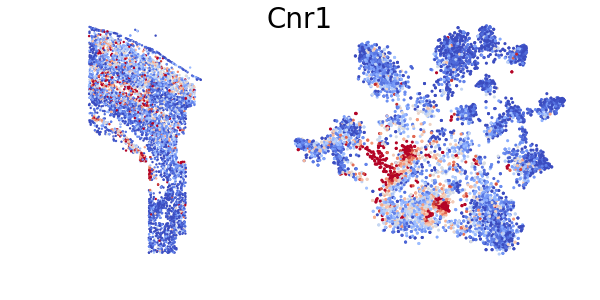

<IPython.core.display.Javascript object>


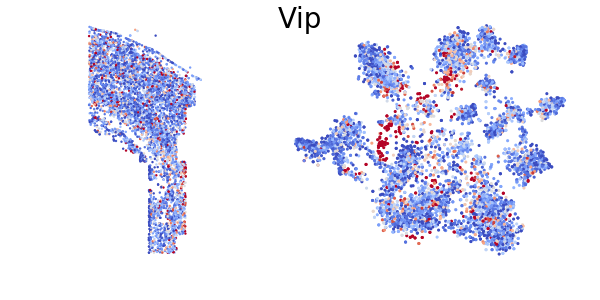

<IPython.core.display.Javascript object>


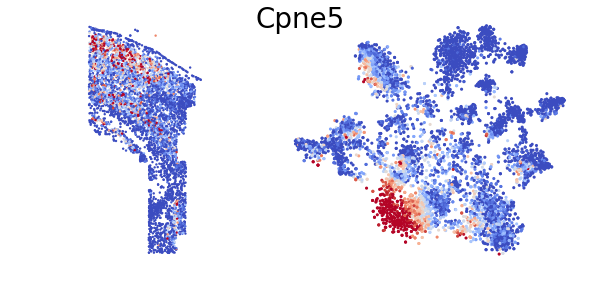

<IPython.core.display.Javascript object>


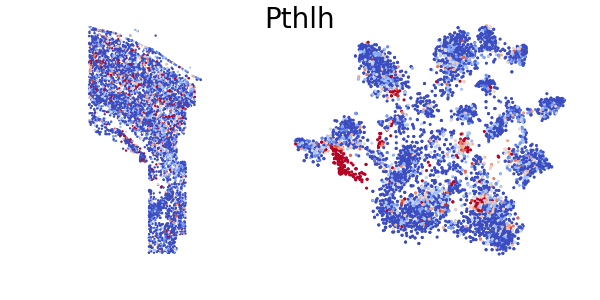

<IPython.core.display.Javascript object>


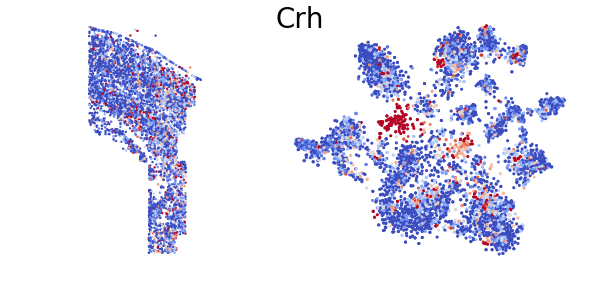

<IPython.core.display.Javascript object>


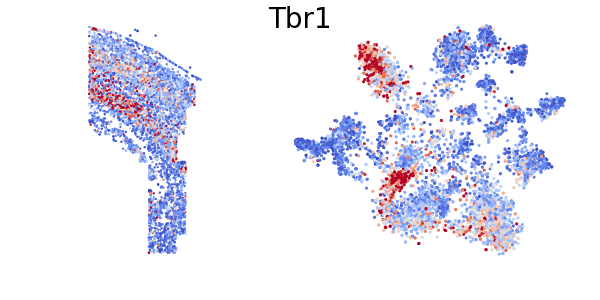

<IPython.core.display.Javascript object>


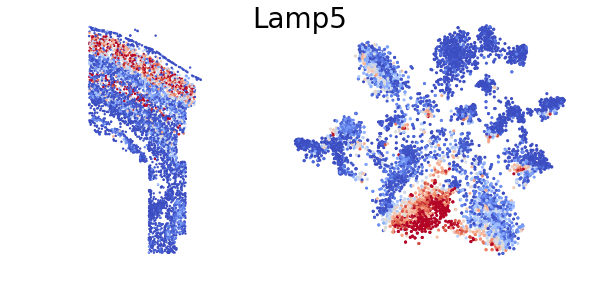

<IPython.core.display.Javascript object>


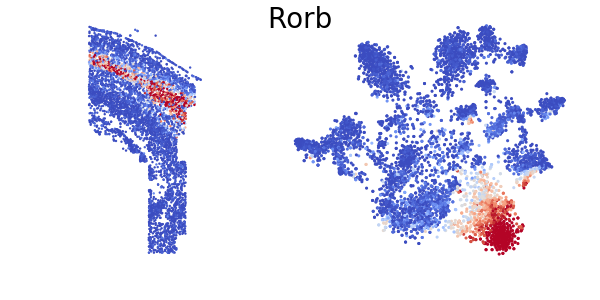

<IPython.core.display.Javascript object>


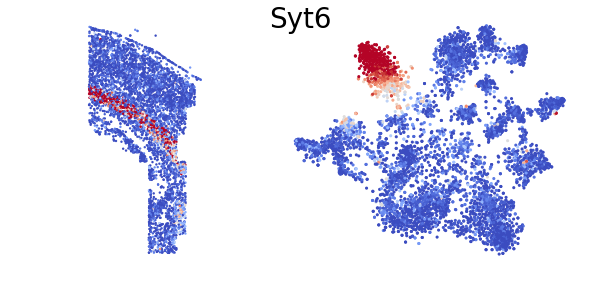

<IPython.core.display.Javascript object>


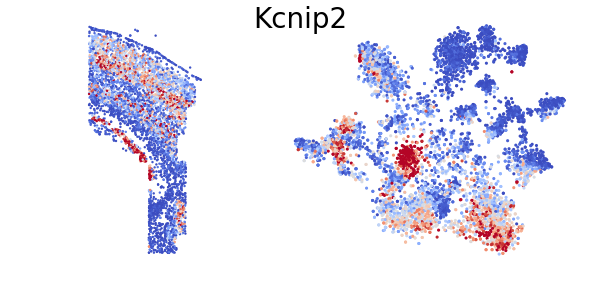

<IPython.core.display.Javascript object>


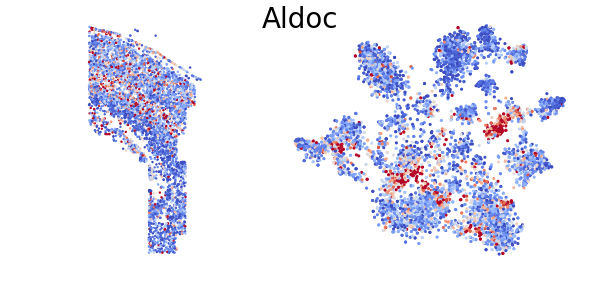

<IPython.core.display.Javascript object>


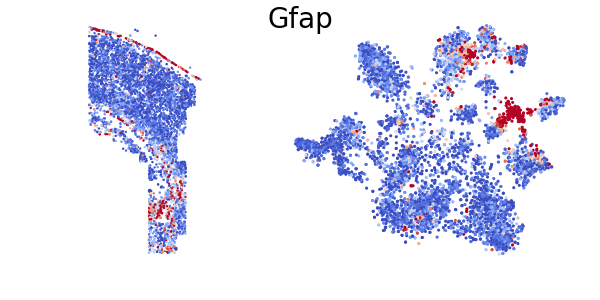

<IPython.core.display.Javascript object>


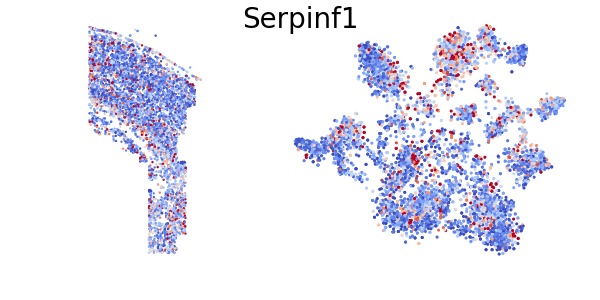

<IPython.core.display.Javascript object>


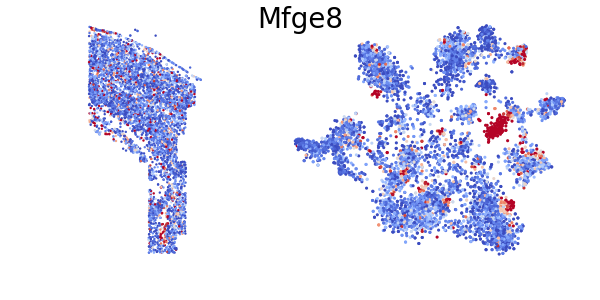

<IPython.core.display.Javascript object>


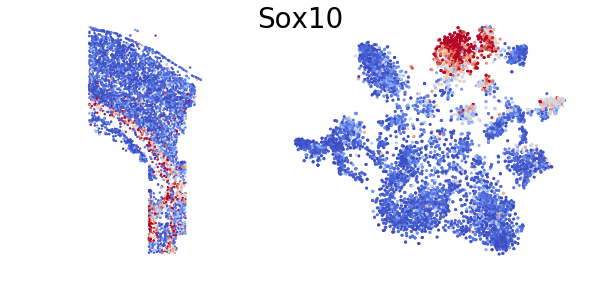

<IPython.core.display.Javascript object>


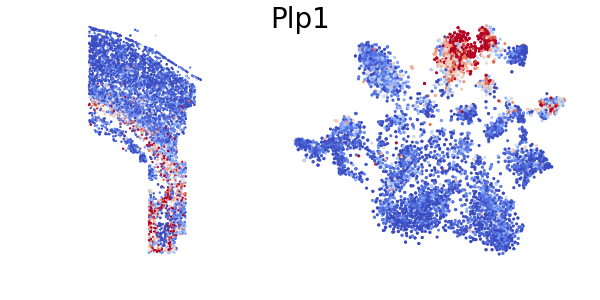

<IPython.core.display.Javascript object>


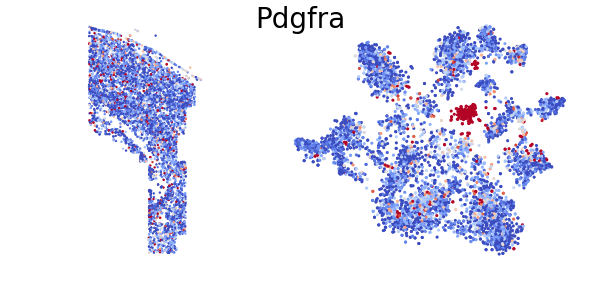

<IPython.core.display.Javascript object>


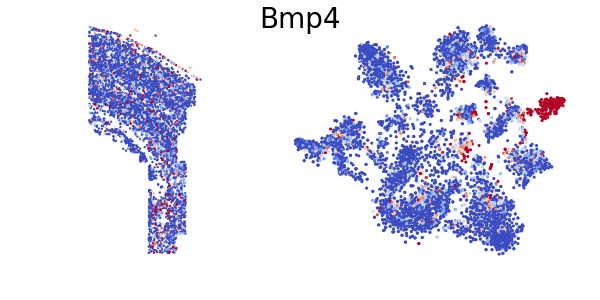

<IPython.core.display.Javascript object>


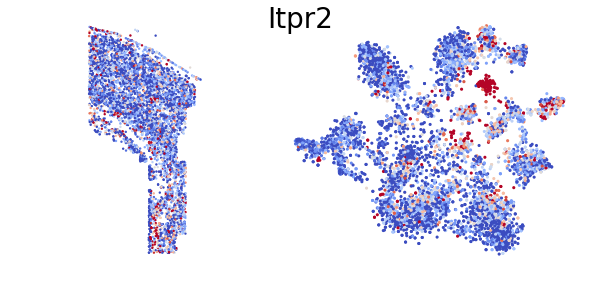

<IPython.core.display.Javascript object>


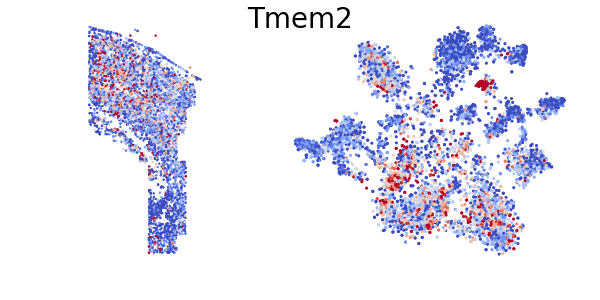

<IPython.core.display.Javascript object>


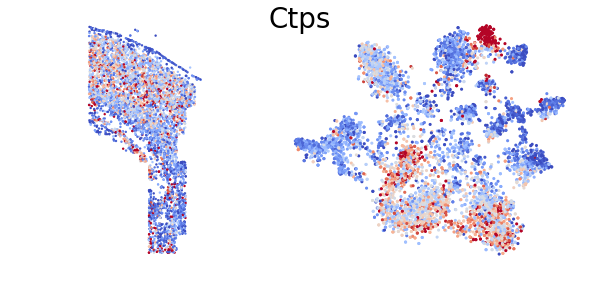

<IPython.core.display.Javascript object>


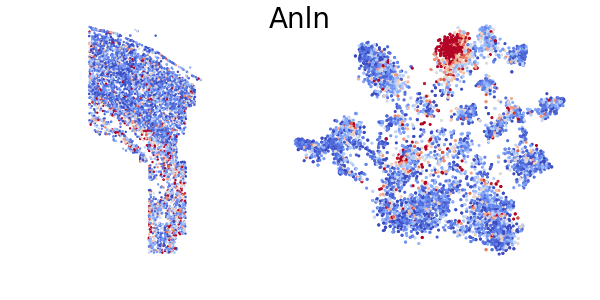

<IPython.core.display.Javascript object>


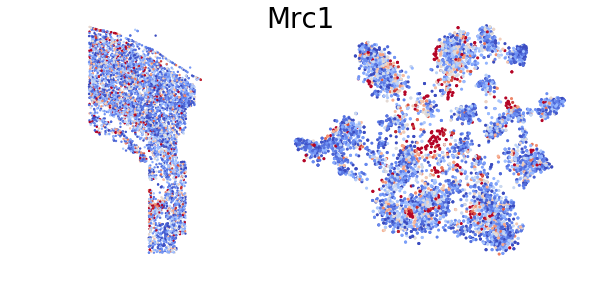

<IPython.core.display.Javascript object>


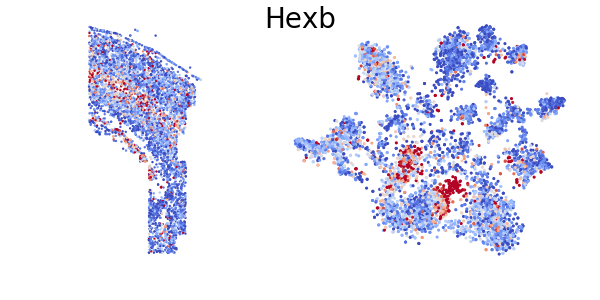

<IPython.core.display.Javascript object>


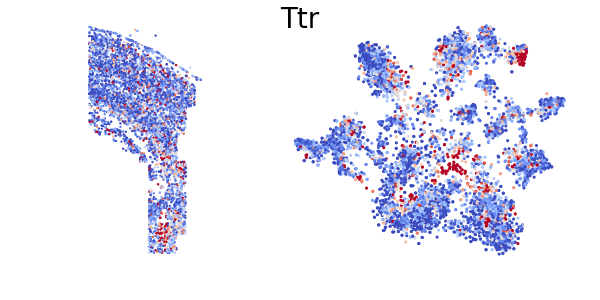

<IPython.core.display.Javascript object>


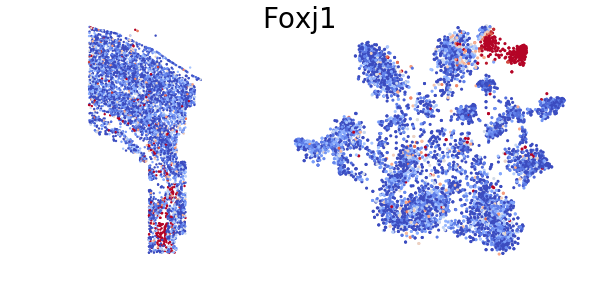

<IPython.core.display.Javascript object>


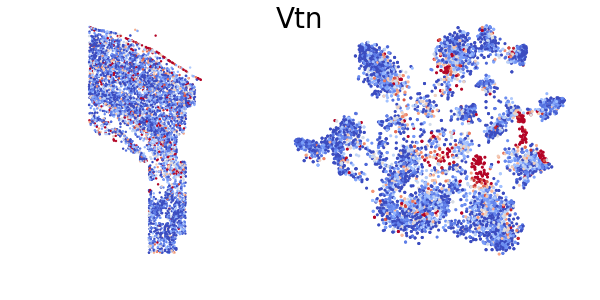

<IPython.core.display.Javascript object>


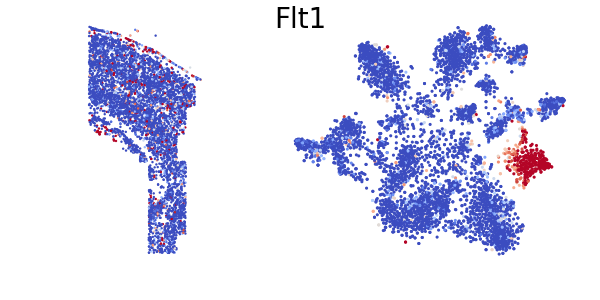

<IPython.core.display.Javascript object>


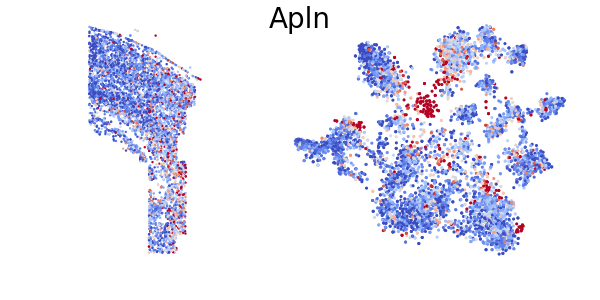

<IPython.core.display.Javascript object>


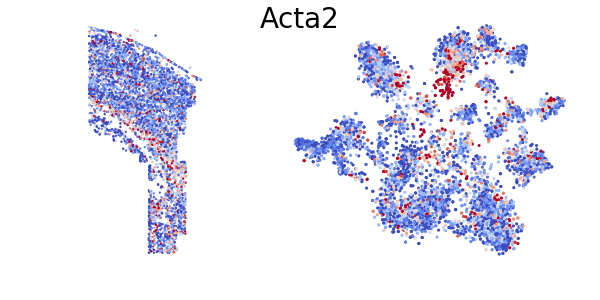

In [451]:
for gene in df_fish_totmol_clean.index:
    fig = plt.figure(figsize=(6,3))
    gs = gridspec.GridSpec(1, 2, width_ratios=[3,6])

    #Plot expression levels of ALL cells on the tissue
    ax0 = plt.subplot(gs[0])
    coord_df_clean = coord_df.loc[:,df_fish_totmol_clean.columns]
    levels = df_fish_totmol.loc[gene,:].values.flat[:]
    levels = np.clip(levels, np.percentile(levels, 0), np.percentile(levels, 95))
    ax0.scatter(coord_df.loc['X'], coord_df.loc['Y'], color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=1,s=3)
    #ax1 = plt.gca()
    ax0.set_axis_off()
    ax0.axis('equal')
    ax0.invert_xaxis()
    ax0.invert_yaxis()

    #Plot the expression levels of the CLEAN cells on the tSNE
    ax1 = plt.subplot(gs[1])
    levels = df_fish_totmol_clean.loc[gene,:].values.flat[:]
    levels = np.clip(levels, np.percentile(levels, 0), np.percentile(levels, 95))
    ax1.scatter(df_tSNE_points.loc['tSNE1'], df_tSNE_points.loc['tSNE2'], color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=1,s=5)
    ax1.axis('equal')
    ax1.set_axis_off()

    """ax2 = plt.subplot(gs[2])
    m = matplotlib.cm.ScalarMappable(cmap = matplotlib.cm.coolwarm)
    m.set_array(levels)
    colorbar = fig.colorbar(m, ticks=[0, max(levels)])
    colorbar.set_ticklabels(['0', '95% max'])
    ax2.set_axis_off()
        """
    plt.suptitle(gene.split('_')[1], fontsize = 20)
    plt.tight_layout()

    plt.savefig('tSNE_and_spatial_expression/spatial_tSNE_expression_{}'.format(gene), dpi=300)

<IPython.core.display.Javascript object>


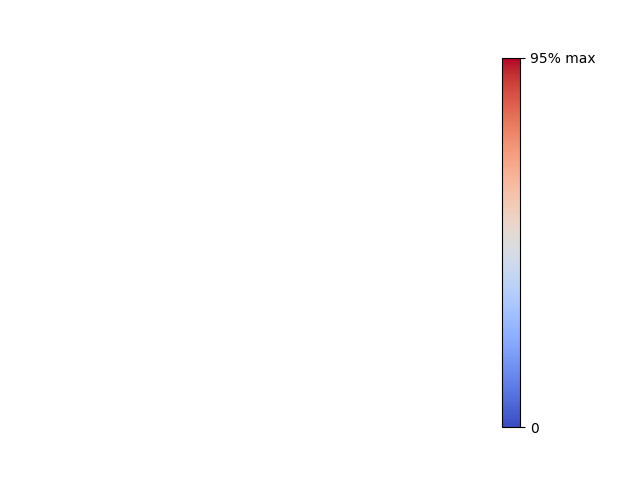

In [452]:
fig = plt.figure()
m = matplotlib.cm.ScalarMappable(cmap = matplotlib.cm.coolwarm)
m.set_array(levels)
colorbar = fig.colorbar(m, ticks=[0, max(levels)])
colorbar.set_ticklabels(['0', '95% max'])
fig.gca().set_axis_off()
plt.savefig('tSNE_and_spatial_expression/colorbar.png')

# Clustering

Clustering: Level_1, label: 0
    Daughter clusters labels: [2 3], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 2
    Daughter clusters labels: [4 5], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 3
    Daughter clusters labels: [6 7], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 4
    Daughter clusters labels: [8 9], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 5
    Daughter clusters labels: [10 11], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11]

Clustering: Level_3, label: 6
    Daughter clusters labels: [12 13], evaluation of split: [3, 0]
    At least one of the 

Finished Clusters:  [7, 11, 13, 15, 17, 10, 25, 26, 27, 21, 33, 35, 37, 40, 43, 49, 51, 42, 55, 56, 57, 58, 59, 47, 63, 64, 65, 66, 68, 69, 71]

Clustering: Level_13, label: 72
    Daughter clusters labels: [74 75], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 15, 17, 10, 25, 26, 27, 21, 33, 35, 37, 40, 43, 49, 51, 42, 55, 56, 57, 58, 59, 47, 63, 64, 65, 66, 68, 69, 71, 75]

Clustering: Level_13, label: 73
    Daughter clusters labels: [76 77], evaluation of split: [2, 2]
    Different enriched genes, expression difference
Finished Clusters:  [7, 11, 13, 15, 17, 10, 25, 26, 27, 21, 33, 35, 37, 40, 43, 49, 51, 42, 55, 56, 57, 58, 59, 47, 63, 64, 65, 66, 68, 69, 71, 75, 76, 77]

Clustering: Level_14, label: 74
    Daughter clusters labels: [78 79], evaluation of split: [3, 0]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 15, 17, 10, 25, 26, 27, 21, 33, 35, 37, 40, 43, 49, 51, 42

<IPython.core.display.Javascript object>


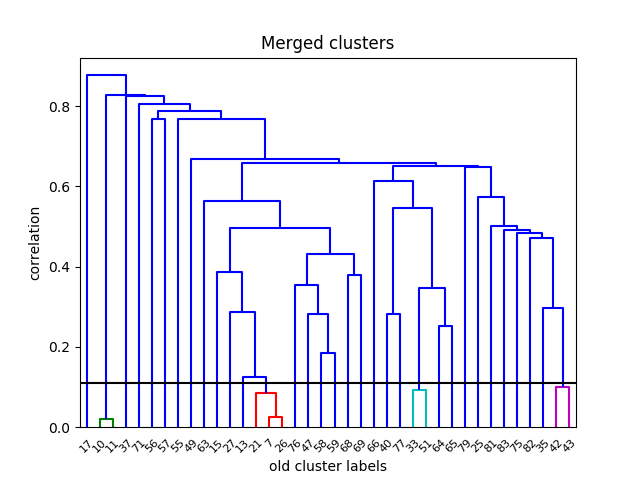

Merged clusters. Started with 38 clusters, merging results to 33 clusters.
7 4
10 1
11 1
13 5
15 7
17 33
21 4
25 27
26 4
27 6
33 17
35 22
37 32
40 15
42 21
43 21
47 10
49 29
51 17
55 30
56 2
57 3
58 8
59 9
63 14
64 18
65 19
66 20
68 12
69 13
71 31
75 24
76 11
77 16
79 28
81 26
82 23
83 25

Merging finished. Result 33 clusters with labels: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33]

33


In [490]:
def iterative_clustering(df, expression_threshold, alpha, min_clust_size, dataset_fraction = 0.1, 
                         allow_level_difference=False, max_cycles = 50, post_merge_bool=False, 
                         post_merge_cutoff = 0, linkage_method='single', 
                         linkage_metric='correlation', fcluster_criterion='distance'):
    """
    Automatic clustering by bifurcation. In each cycle the dataset(s) are split into two by 
    agglomerative clustering. Each daughter cluster is evaluated to see if it contains
    more complexity and should be split further or if it is a homogenous cluster. The 
    intermediate and final labels of each cell are added to the label matrix. Each row is
    the result of a clustering cycle where each of the individual labels are split and 
    evaluated. If a cluster is done the label is permanently added to the label matrix.
    When all clusters are done the clustering stops. 
    Optionally it is possible to merge clusters again after clustering. This functionality 
    is added because the agglomerative clustering somtimes makes splits based on a gene
    expression level difference (that can not be caught by the "allow_level_difference"
    parameter), which might not be desirable depending on the expriment/biology.
    Input:
    `df`(pandas dataframe): Dataframe to clusters. Cells as columns, genes as rows.
    `expression_threshold`(float): Value above which a gene is considered expressed. 
        Normalize the data such that the threshold makes sense for all genes.
    `alpha`(float): p-value cutoff for Mann-Whitney U test to decide if there is a 
        expression difference between two clusers. The function makes multiple 
        comparisons. Typicaly an alpha around 0.1e-20 works. 
    `min_cluste_size`(int): Minimal number of cells per cluster.
    `dataset_fraction`(float 0-1): IF a subcluster is larger than the dataset_fraction
        times the number of cells, it is classified as too large and will be further 
        clustered. 
    `allow_level_difference`(bool): Whether or not a cluster is allowed to split based
        on a significant level difference between the same enriched genes. (Does not
        catch all cases, see post_merge)
    `max_cycles`(int): Max number of cycles of clustering. Will print an statement if
        clustering is not yet done when the max number is reached.
    `post_merge_bool`(bool): Merge clusters that XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX
    
    
    `post_merge_cutoff`(float): Merge clusters that have a distance from each 
            other below the cutoff.
    `linkage_method`(string): Scipy linkage methods. Default = 'single'
    `linkage_metric`(string): Scipy lingae metric. Default = 'correlation'
    `fcluster_criterion`(string): Scipy fcluster criterion. Default = 'distance'
    
    Returns:
    `label_matrix` (pandas datafame): Table of the cluster labels for each cell. Each
        row contains one iteration. Last row contains the final clusters. 
        Acces: label_matrix.iloc[-1]
    
    """
    
    def cluster_evaluation2(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
        """
        Check if the clusters pass the criteria.
        Returns: 
        Evaluation, format: [x,y]
        x: 0=no enriched genes, 1=same enriched genes, 2=different enriched genes
            3=one of the sub clusters is too large
        y: 0=no differentially expressed genes, 1=same genes differentially expressed
            (level difference), 2=genes differentially expressed

        """
        evaluation = [0,0]

        #Investigate if there are genes enriched in a cluster
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()

        if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
            evaluation[0] = 3

        elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
            evaluation[0] = 0
        elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
            if allow_level_difference == True:
                evaluation[0] = 1
            else:
                evaluation[0] = 0
        elif enriched_df1 != enriched_df2: #At least one gene differentialy enriched
            evaluation[0] = 2

        #Test if there is a significant difference in the enriched genes between the groups
        diff_expressed = {'df1':[], 
                          'df2':[], # THIS CAN BE REMOVED
                          'both':[]}
        for gene in [i for i in enriched_df1 if i in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['both'].append([gene, test_p])
                evaluation[1] = 1
        for gene in [i for i in enriched_df1 if i not in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df1'].append([gene, test_p])
                evaluation[1] = 2
        for gene in [i for i in enriched_df2 if i not in enriched_df1]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df2'].append([gene, test_p])
                evaluation[1] = 2
        return evaluation
    
    def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
        """
        Check if the clusters pass the criteria.
        Returns: 
        Evaluation, format: [x,y]
        x: 0=no enriched genes, 1=same enriched genes, 2=different enriched genes
            3=one of the sub clusters is too large
        y: 0=no differentially expressed genes, 1=same genes differentially expressed
            (level difference), 2=genes differentially expressed

        """
        evaluation = [0,0]

        enriched_df1 = []
        for g in df1.index:
            if df1.loc[g].mean() > expression_threshold and scipy.stats.mannwhitneyu(df1.loc[g], df2.loc[g], alternative='two-sided')[1] < alpha:
                enriched_df1.append(g)
                
        enriched_df2 = []
        for g in df2.index:
            if df2.loc[g].mean() > expression_threshold and scipy.stats.mannwhitneyu(df1.loc[g], df2.loc[g], alternative='two-sided')[1] < alpha:
                enriched_df2.append(g)
                
        if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
            evaluation[0] = 3
        #No enriched genes in both groups
        elif enriched_df1 == [] and enriched_df2 == []: 
            evaluation = [0,0]
        #Same enriched genes for both groups, level difference
        elif enriched_df1 == enriched_df2: 
            if allow_level_difference == True:
                evaluation = [1,1]
            else:
                evaluation = [0,0]
        #At least one gene differentialy enriched
        elif enriched_df1 != enriched_df2: 
            evaluation = [2,2]

        return evaluation
    
    def re_cluster(dfs = []):
        """
        Evaluate a list of clusters (dataframes) by splitting them again and 
        evaluating the daughter clusters.
        Input:
        `dfs`(list): List of Pandas dataframes containing one cluster.

        """
        re_evaluation = []
        for d in dfs:
            split = AgglomerativeClustering(n_clusters=2).fit(d.T)
            split_labels = split.labels_ 
            df_daughter_1 = d.loc[:,split_labels == np.unique(split_labels)[0]]
            df_daughter_2 = d.loc[:,split_labels == np.unique(split_labels)[1]]
            re_evaluation.append(cluster_evaluation(df_daughter_1, df_daughter_2, expression_threshold, 
                                                    alpha, dataset_fraction,
                                                    allow_level_difference=allow_level_difference))
        return(re_evaluation)  
    
            
    def mean_expression(df, labels):
        """
        Make dataframe with mean expression per label.

        """
        #Make df with count averages per cluster
        df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
        for l in np.unique(labels):
            filt = labels == l
            mean = np.array(df.loc[:,filt].T.mean())
            #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
            if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
                df_count_average[l] = mean
        return df_count_average
    
    def post_merge(df, labels, post_merge_cutoff, linkage_method='single', linkage_metric='correlation', fcluster_criterion='distance'):
        """
        Merge clusters based on likage and a cutoff. The mean expression levels of 
        the clusters are linked and them merged based on the cutoff provided.
        Input:
        `df`(Pandas dataframe): df with expression matrix. row-genes, col-cells.
        `labels`(list/array): Labels of the cells.
        `post_merge_cutoff`(float): Merge clusters that have a distance from each 
            other below the cutoff.
        `linkage_method`(string): Scipy linkage methods. Default = 'single'
        `linkage_metric`(string): Scipy lingae metric. Default = 'correlation'
        `fcluster_criterion`(string): Scipy fcluster criterion. Default = 'distance'

        Returns:
        `new_labels`(list): List of new cell labels after merging. 
        Additionally it plots the dendrogram showing which clusters are merged.

        """
        #merge the labels based on parameters
        df_mean = mean_expression(df, labels)
        Z = scipy.cluster.hierarchy.linkage(df_mean.T, method=linkage_method, metric=linkage_metric)
        merged_labels_short = scipy.cluster.hierarchy.fcluster(Z, post_merge_cutoff, criterion=fcluster_criterion)

        #Update labels  
        label_conversion = dict(zip(df_mean.columns, merged_labels_short))
        label_conversion_r = dict(zip(merged_labels_short, df_mean.columns))
        new_labels = [label_conversion[i] for i in labels] 

        #Plot the dendrogram to visualize the merging
        fig, ax = plt.subplots()
        scipy.cluster.hierarchy.dendrogram(Z, labels=df_mean.columns ,color_threshold=post_merge_cutoff)
        ax.hlines(post_merge_cutoff, 0, ax.get_xlim()[1])
        ax.set_title('Merged clusters')
        ax.set_ylabel(linkage_metric)
        ax.set_xlabel('old cluster labels')

        print('Merged clusters. Started with {} clusters, merging results to {} clusters.'.format(
            len(np.unique(labels)), len(np.unique(merged_labels_short))))
        
        for k in label_conversion.keys():
            print(k, label_conversion[k])

        return new_labels 

    #=========================================================================
    finished_clusters = []
    label_ofset = 0
    finished = False

    #Make matrix for labels. First row all zeros
    label_matrix = pd.DataFrame(data= np.zeros((1, df.shape[1])), index = ['Level_0'], columns=df.columns, dtype='Int64')

    for cycle, x in enumerate(range(max_cycles)):

        previous_level = 'Level_{}'.format(cycle)
        current_level = 'Level_{}'.format(cycle + 1)

        if list(set(label_matrix.loc[previous_level]) - set(finished_clusters)) == []:
            print('\nNo difference between the last two label levels. Clustering completed.')
            finished = True
            break

        #Add row and copy labels
        label_matrix.loc[current_level] = label_matrix.loc[previous_level]

        #Loop through all labels that are not in finished_clusters
        for old_label in [i for i in np.unique(label_matrix.loc[current_level]) if i not in finished_clusters]:
            label_ofset += 2
            print('Clustering: {}, label: {}'.format(current_level, old_label))

            #Create dataframe to split
            filt = label_matrix.loc[current_level] == old_label
            df_to_split = df.loc[:,filt]

            #Cluster dataframe into two clusters
            split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)
            split_labels = split.labels_ + label_ofset #Labels are 0 and 1, shift them with the clustering step
            unique_split_labels = np.unique(split_labels)

            #Check if all the clusters are larger than the min_clust_size
            if all(i > min_clust_size for i in list(Counter(split_labels).values())):

                #Make df1 & df2
                df1 = df_to_split.loc[:,split_labels == unique_split_labels[0]]
                df2 = df_to_split.loc[:,split_labels == unique_split_labels[1]]

                #Evaluate split
                evaluation = cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction)

                print('    Daughter clusters labels: {}, evaluation of split: {}'.format(unique_split_labels, evaluation))
                #List of the labels that are valid clusters (or will be in the next cycle)
                valid_labels = []

                #_____________________________________________________________________
                if evaluation[0] == 3:
                    print('    At least one of the daughter clusters is too large')
                    threshold = dataset_fraction * df.shape[1]
                    if df1.shape[1] > threshold and df2.shape[1] > threshold:
                        valid_labels.extend(unique_split_labels)
                    elif df1.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[0])
                        re_evaluation = re_cluster([df2])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[1])
                            valid_labels.append(unique_split_labels[1])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[1])
                    elif df2.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[1])
                        re_evaluation = re_cluster([df1])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[0])
                            valid_labels.append(unique_split_labels[0])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[0])


                #No enriched genes, NO expression difference
                elif evaluation[0] == 0:
                    print('    No enriched genes, No expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #No valid daughter clusters in the next cycle
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0:
                        finished_clusters.append(old_label)
                        print('    Encountered a cluster without expression: {}{}'.format(current_level, old_label))
                    #Valid daughter clusters in the next cycle
                    else:
                        valid_labels.extend(unique_split_labels)

                #Different genes enriched, expression difference
                elif evaluation[0] == 2 and evaluation[1] == 2:
                    print('    Different enriched genes, expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #First cluster
                    if re_evaluation[0][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[0])
                        valid_labels.append(unique_split_labels[0])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[0])
                    #Second cluster
                    if re_evaluation[1][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[1])
                        valid_labels.append(unique_split_labels[1])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[1])    


                #Different genes enriched, NO expression difference
                elif evaluation[0] == 2 and evaluation[1] == 0:
                    print('    Encounterd a difference but no significant difference {} {}-->{}'.format(current_level, old_label, unique_split_labels))
                    re_evaluation = re_cluster([df1, df2])
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0: #No valid daughter clusters
                        finished_clusters.append(old_label)
                    else:
                        valid_labels.extend(unique_split_labels)

                #Same or more enriched, expression level difference
                elif evaluation[0] > 0 and evaluation[1] == 1:
                    print('    Encountered a split with similar expressed genes')
                    if allow_level_difference == True:
                        valid_labels.extend(unique_split_labels)
                        finished_clusters.extend(unique_split_labels)
                    else:
                        finished_clusters.append(old_label)


                #Same enriched, NO expression difference
                elif evaluation[0] == 1 and evaluation[1] == 0:
                    print('    Same genes enriched but no expression idfference')
                    finished_clusters.append(old_label) #Not a valid split, current cluster finished  

                else:
                    print('ERROR, Split evaluation did not fit the criteria: {} in: {} {}'.format(evaluation, current_level, old_label))

                #_____________________________________________________________________

            else:
                finished_clusters.append(old_label)

            #Add labels to matrix
            final_split_labels = [old_label if i not in valid_labels else i for i in split_labels]
            for c, i in enumerate(filt):
                if i == True:
                    count_true = Counter(filt[:c])[True] #Count how many Trues already have been passed
                    label_matrix.loc[current_level][c] = final_split_labels[count_true] #Add the new labels to the label matrix
            print('Finished Clusters:  {}\n'.format(finished_clusters))
    
    if finished == False:
        print('Max number of cycles reached. Possibly there is more structure with more rounds of clustering.')
    print('\nClustering finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), np.unique(label_matrix.iloc[-1])))
    
    if post_merge_bool == True:
        label_matrix.loc['Post_merge'] = post_merge(df, label_matrix.iloc[-1], post_merge_cutoff, 
                                                    linkage_method=linkage_method, linkage_metric=linkage_metric, 
                                                    fcluster_criterion=fcluster_criterion)
        print('\nMerging finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), 
                                                                                np.unique(label_matrix.iloc[-1])))
    
    return label_matrix




label_matrix = iterative_clustering(df_fish_totmol, 
                     expression_threshold = 550, #350
                     alpha = 0.1e-20,#15
                     min_clust_size = 15, 
                     dataset_fraction = 0.05, #0.1
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge_bool = True,
                     post_merge_cutoff = 0.11)

"""(df_fish_totmol, 
                     expression_threshold = 400, 
                     alpha = 0.1e-20,
                     min_clust_size = 15, 
                     dataset_fraction = 0.05, 
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge = True,
                     post_merge_r = 0.865)"""


last_level = label_matrix.iloc[-1]

cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol, np.array(last_level))
print(len(np.unique(labels_a)))

In [483]:
def mean_expression(df, labels):
    """
    Make dataframe with mean expression per cluster. 
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
    for l in np.unique(labels):
        filt = labels == l
        mean = np.array(df.loc[:,filt].T.mean())
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

def heat_map(df, labels, sort=None, cluster_colors=None, cluster_number = False, save=False, name=''):
    """
    Plot heat_map of a dataframe.
    Input:
    `df`(pandas dataframe): Dataframe to plot. Cells as columns, genes as rows.
    `labels`(list/array): list of labels of the cells in the same order as the 
        df columns.
    `sort`(list): List of sorted cluster numbers. If None it will plot them in
        assending order
    `cluster_colors`(dict): Dictionary matching cluster numbers with colors
        in the hex fomat. Like '#ff0000' for red
    `cluster_number`(bool): Show cluster numbers in the top color bar. Usefull
        when manually sorting the clusters.
    `save`(bool): option to save the figure as png with 300dpi.
    `name`(str): Name to use when saving
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('df used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    cl, lc = gen_labels(df, np.array(labels))[:2]
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = sum([lc[i] for i in optimal_order], [])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = [cl[i] for i in optimal_sort_cells]
    
    fig, axHM = plt.subplots(figsize=(9,5))
    
    df_full = df.copy() # _fish_log
    z = df_full.values
    z = z/np.percentile(z, 99, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    
    im = axHM.pcolormesh(z, cmap='viridis', vmax=1)
    
    arial_font = {'fontname' : 'Arial'}
    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8, **arial_font)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)
  
    counter = Counter(labels)
    pos=0
    if cluster_colors == None:
        optimal_sort_labels = np.array(optimal_sort_labels)
        axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='jet')
        if cluster_number==True:
            for l in optimal_order:
                axLabel.text(pos + (counter[l]/2), 1.2, l, fontsize=8,
                         horizontalalignment='center', verticalalignment='center', **arial_font )
            pos += Counter(labels)[l]
        
    else:
        for l in optimal_order:
            axLabel.barh(bottom = 0, left = pos, width = counter[l], color=cluster_colors[l],
                        linewidth=0.5, edgecolor=cluster_colors[l])
            if cluster_number==True:
                axLabel.text(pos + (counter[l]/2), 0, l, fontsize=8,
                         horizontalalignment='center', verticalalignment='center', **arial_font )
            pos += Counter(labels)[l]
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=300)
    
    
def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj OR array): Clustering object. OR numpy array with cell labels.
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a


In [492]:
#Remove bad clusters, with an 
bad_clusters = [11, 23] #86, 88
label_matrix_clean = label_matrix.copy()
for i in bad_clusters:
    label_matrix_clean = label_matrix_clean.loc[:,label_matrix.loc['Post_merge'] != i]
    
df_fish_totmol_clean = df_fish_totmol.loc[:, label_matrix_clean.columns]

last_level = label_matrix_clean.iloc[-1]
cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol_clean, np.array(last_level))
print(len(np.unique(labels_a)))

31


df used for plot: df_fish_totmol_clean
Order of clusters: [18, 17, 14, 19, 15, 16, 20, 9, 8, 10, 6, 5, 4, 12, 1, 13, 3, 2, 32, 33, 30, 22, 21, 28, 29, 24, 27, 31, 7, 26, 25]


<IPython.core.display.Javascript object>


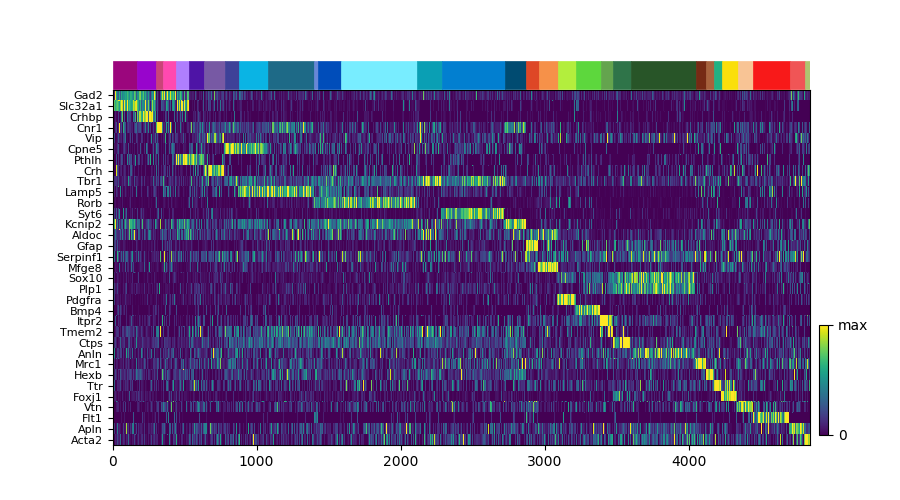

In [493]:
cluster_sort = [18,17,14,19,15,16,20,
                9,8,10,6,5,4,12,1,13,
                3,2,
                32,33,30,22,21,
                28,29,24,27,31,7,26,25]

heat_map(df_fish_totmol_clean, labels, cluster_colors=cluster_colors, cluster_number=False,
        sort = cluster_sort, save=False, name='Heatmap_totmol_clean_180220')


In [ ]:
#pickle.dump(cell_labels,  open( "cell_labels_5208_totmol.p", "wb" ))

<IPython.core.display.Javascript object>


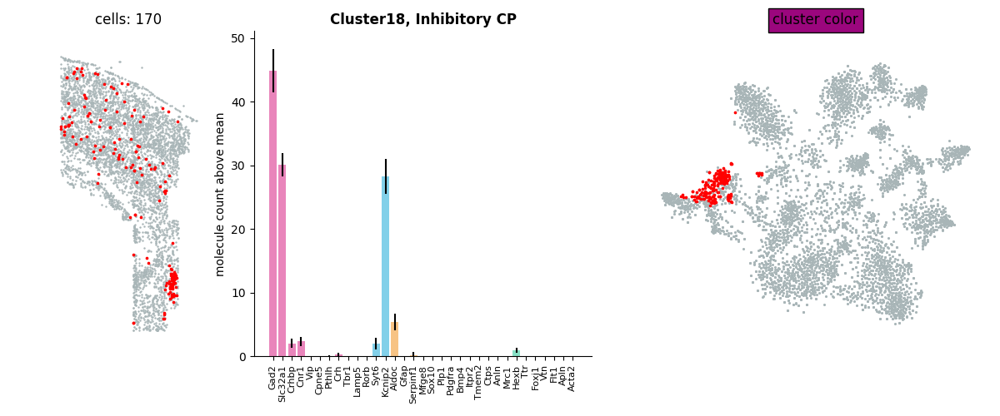

<IPython.core.display.Javascript object>


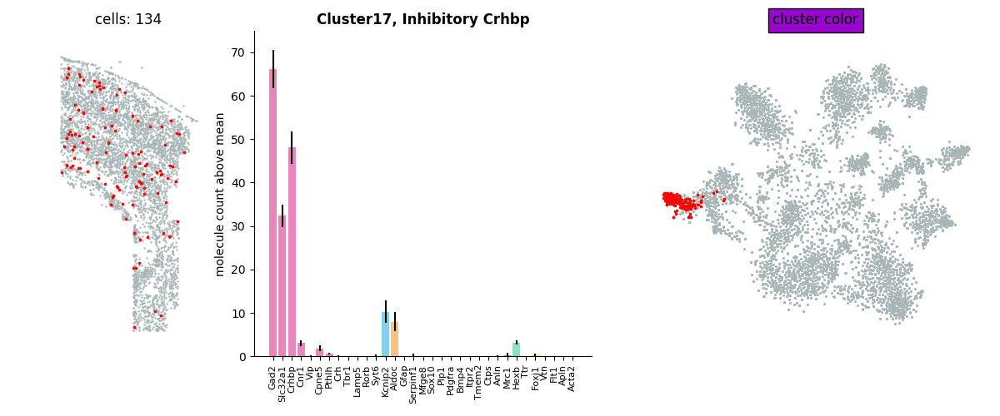

<IPython.core.display.Javascript object>


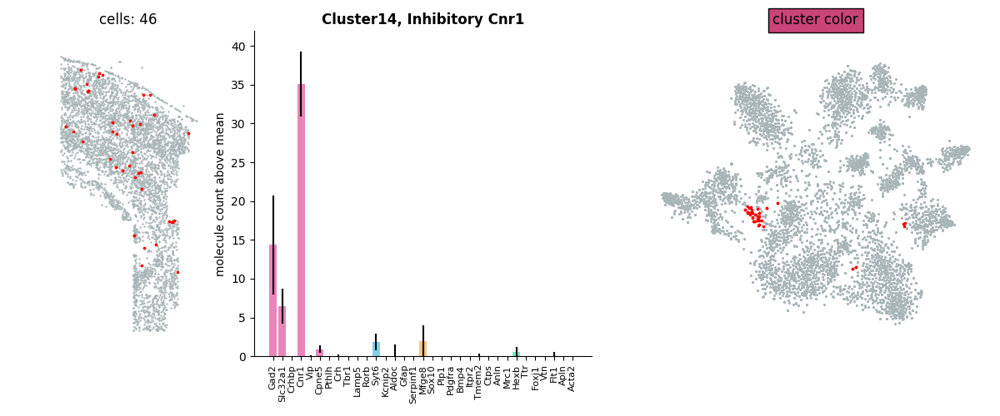

<IPython.core.display.Javascript object>


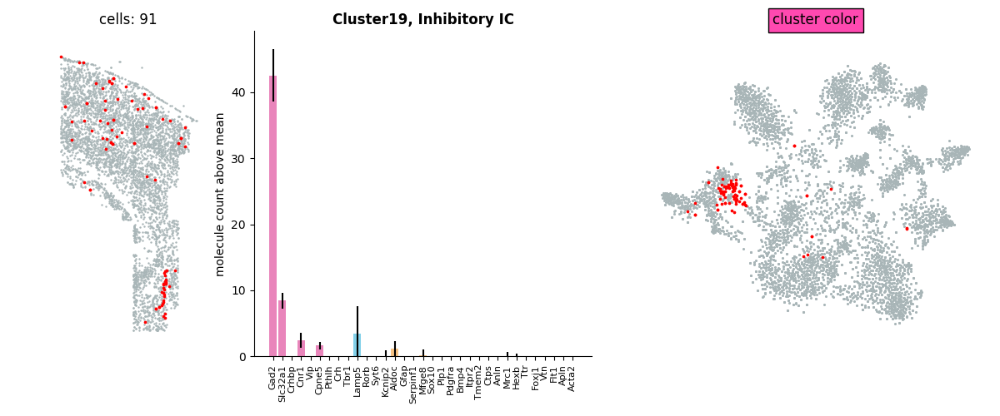

<IPython.core.display.Javascript object>


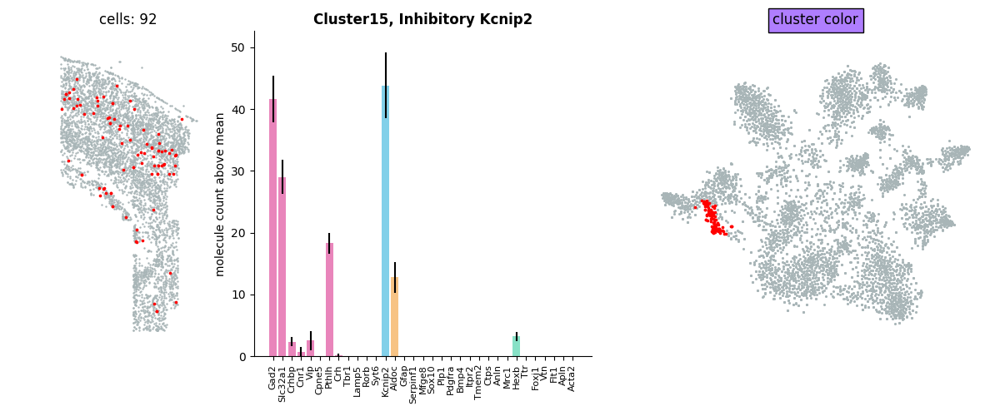

<IPython.core.display.Javascript object>


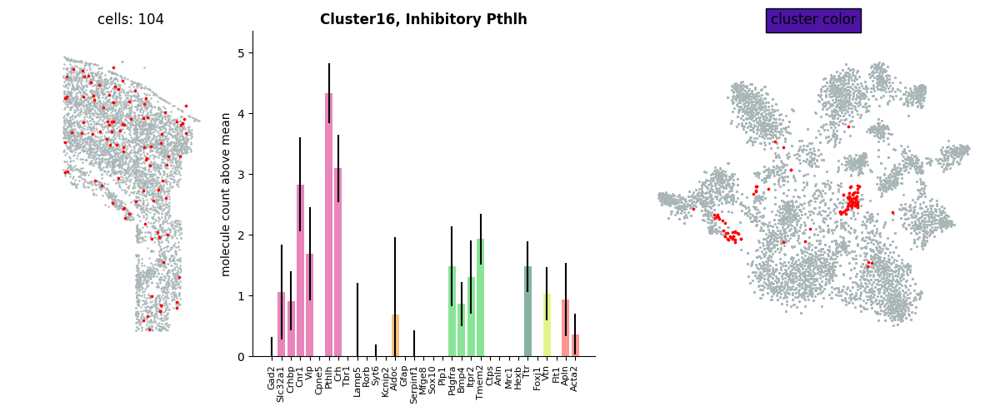

<IPython.core.display.Javascript object>


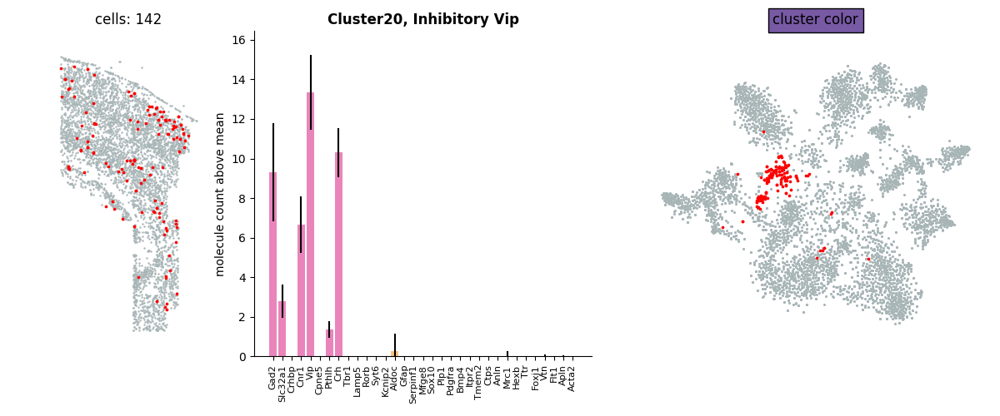

<IPython.core.display.Javascript object>


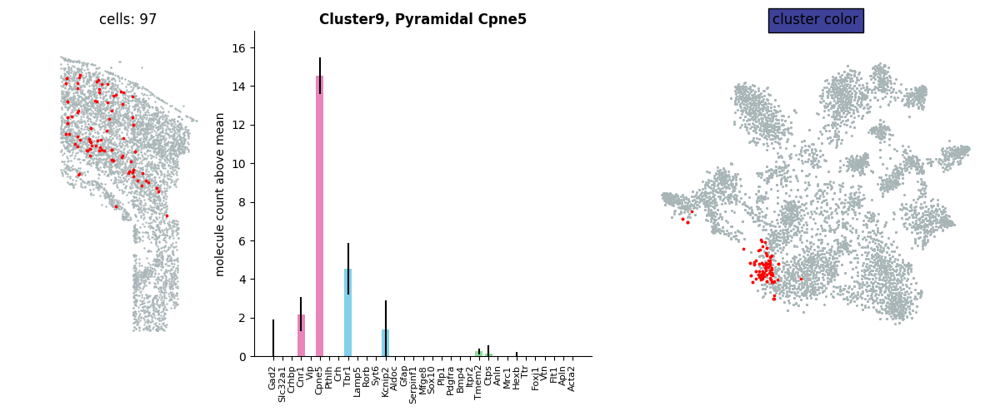

<IPython.core.display.Javascript object>


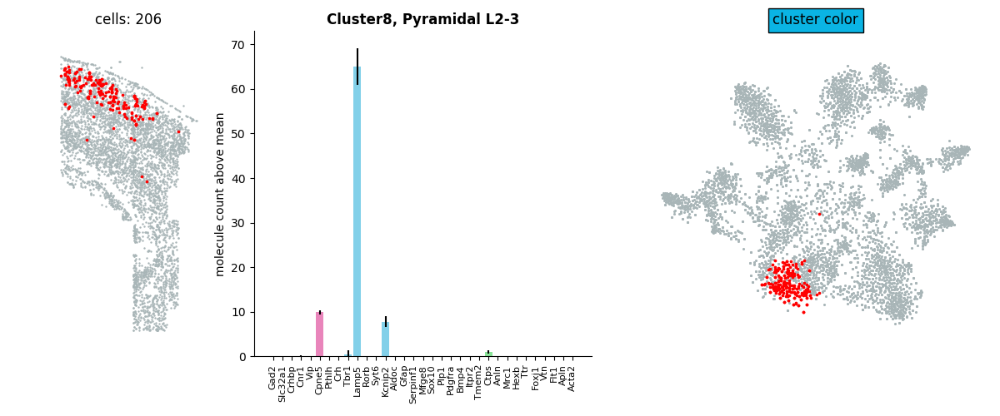

<IPython.core.display.Javascript object>


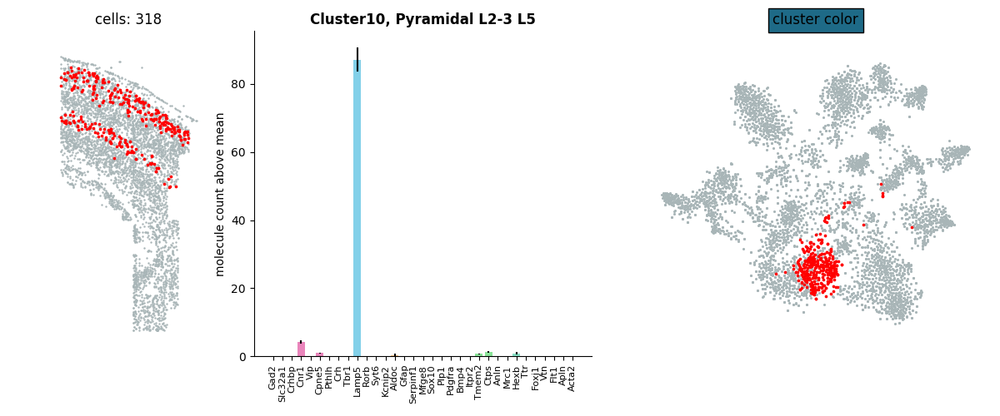

<IPython.core.display.Javascript object>


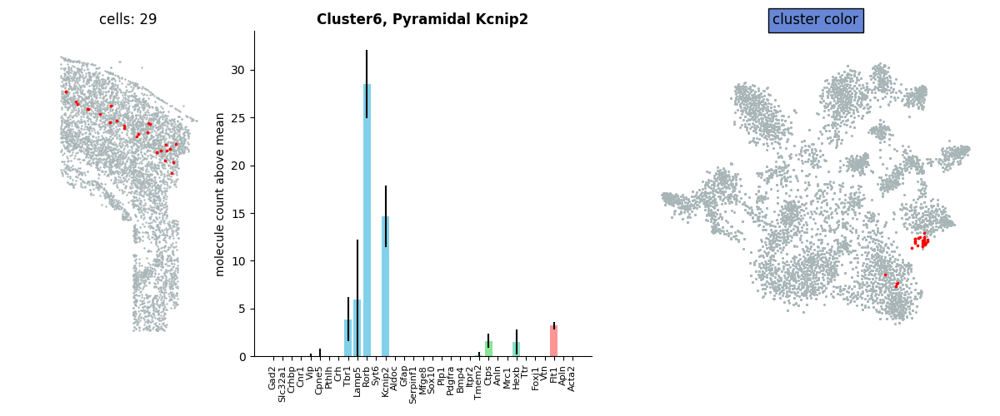

<IPython.core.display.Javascript object>


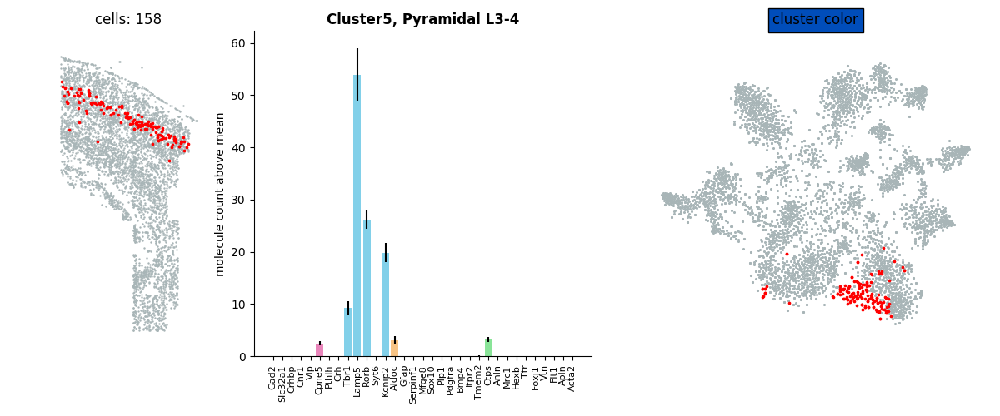

<IPython.core.display.Javascript object>


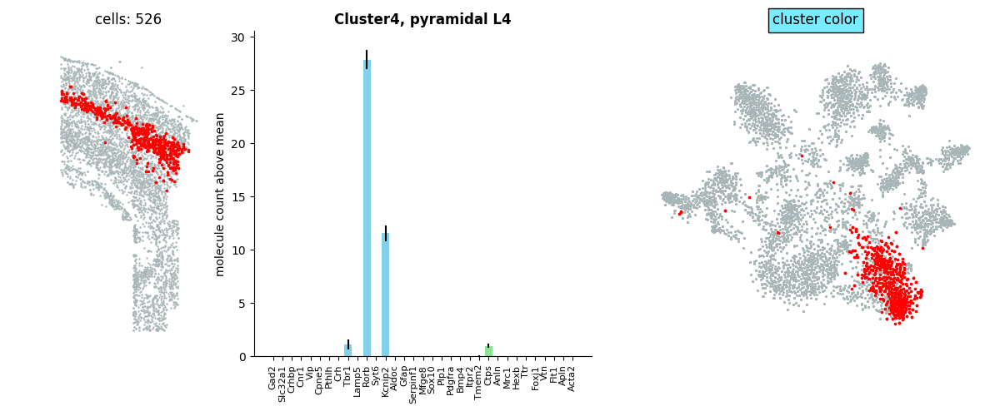

<IPython.core.display.Javascript object>


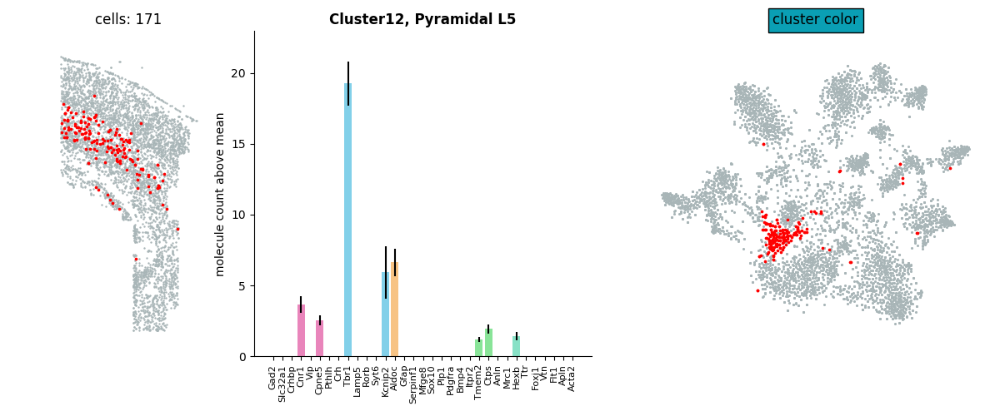

<IPython.core.display.Javascript object>


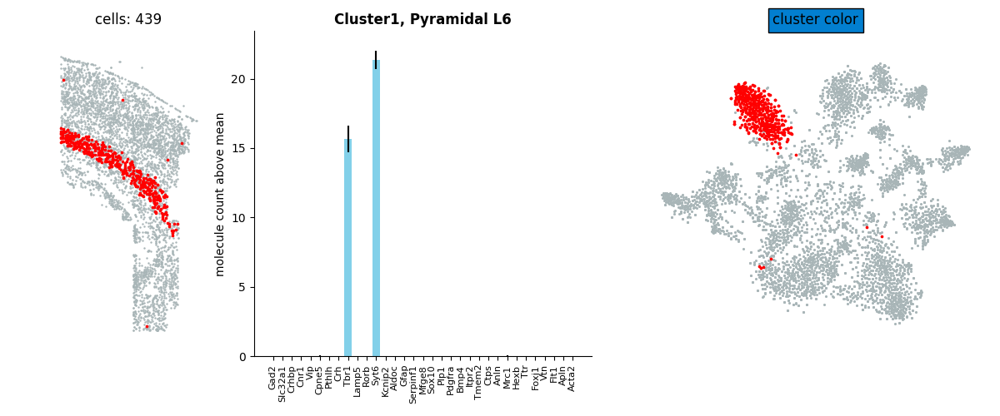

<IPython.core.display.Javascript object>


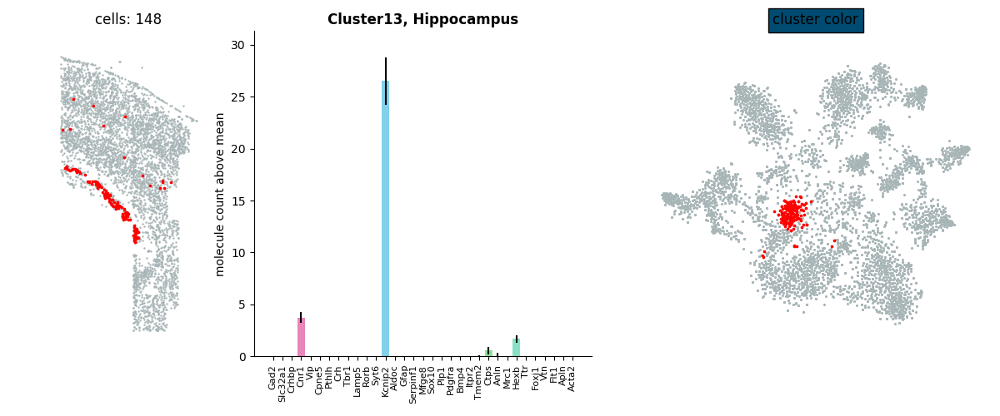

<IPython.core.display.Javascript object>


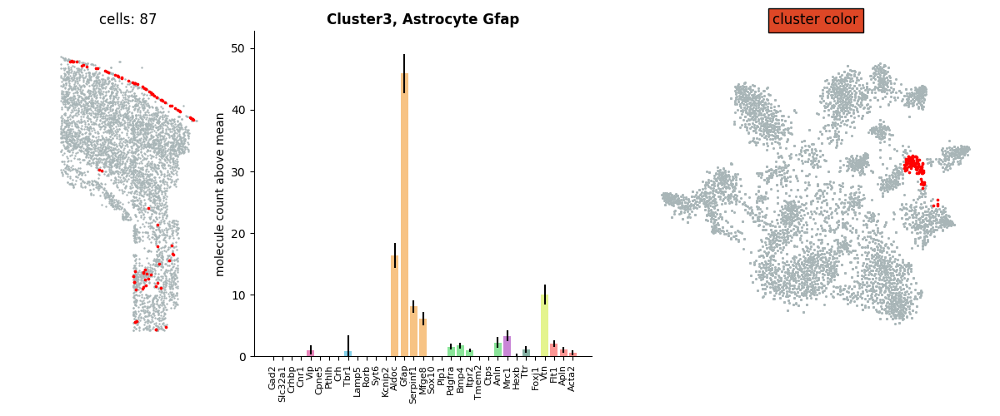

<IPython.core.display.Javascript object>


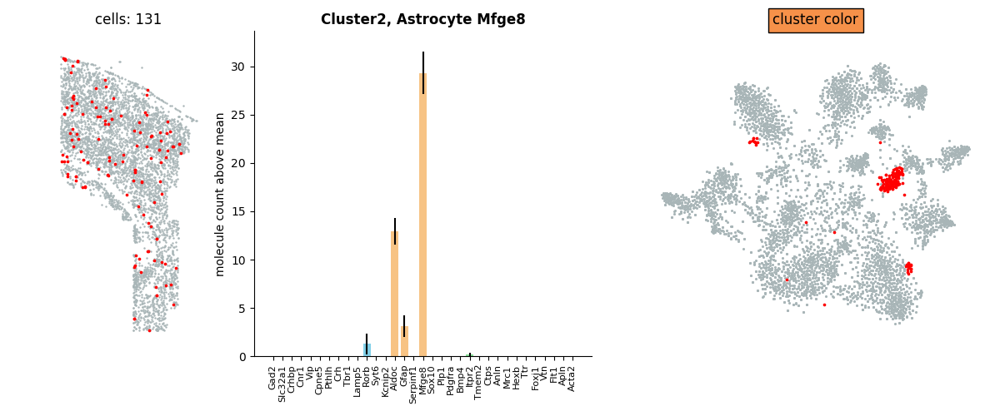

<IPython.core.display.Javascript object>


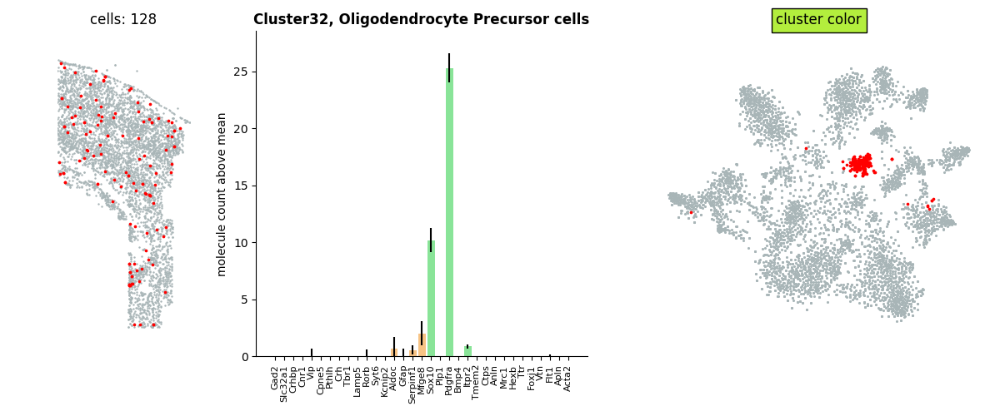

<IPython.core.display.Javascript object>


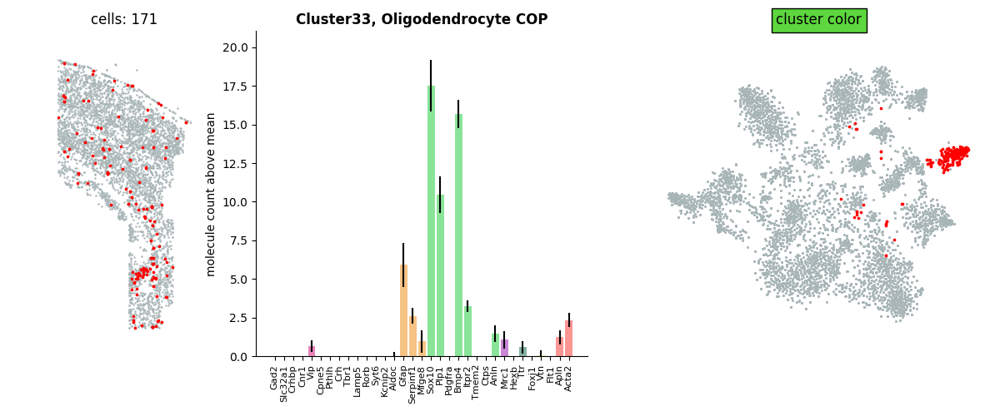

<IPython.core.display.Javascript object>


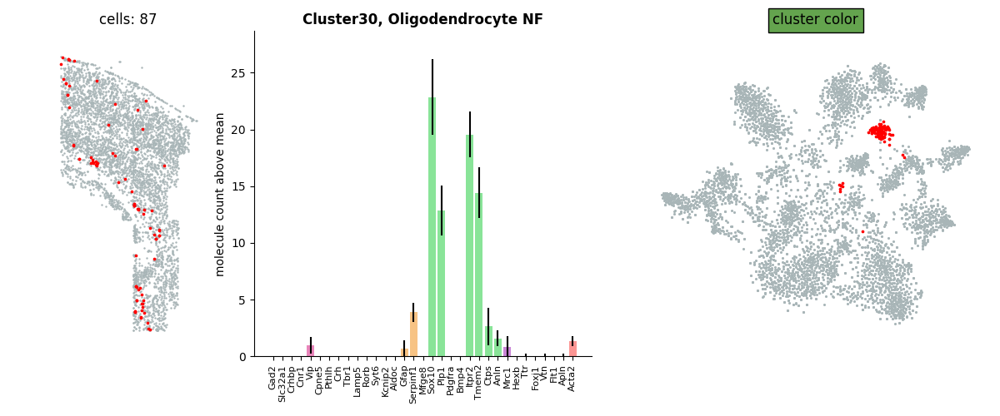

<IPython.core.display.Javascript object>


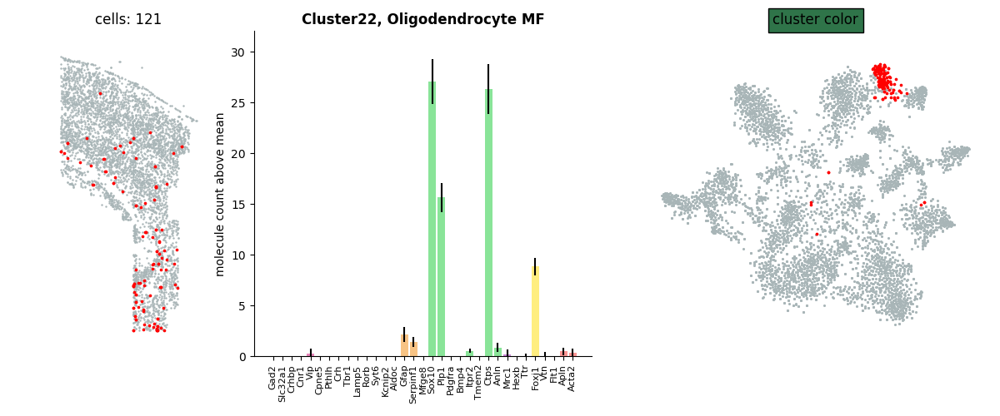

<IPython.core.display.Javascript object>


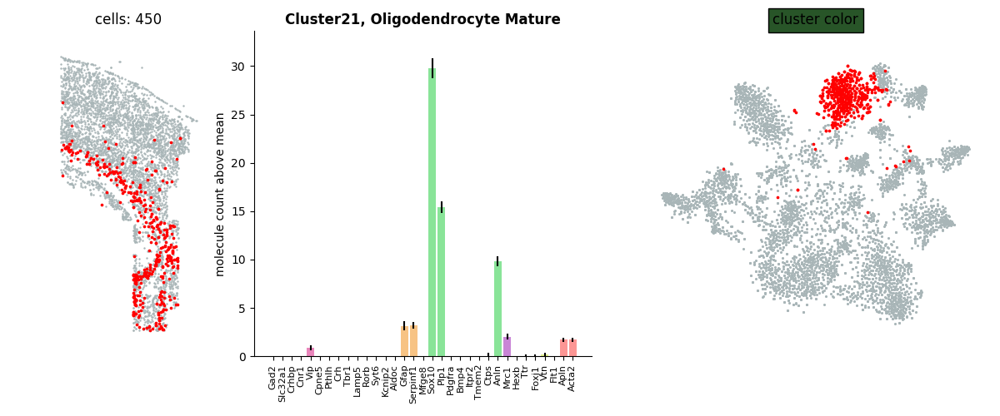

<IPython.core.display.Javascript object>


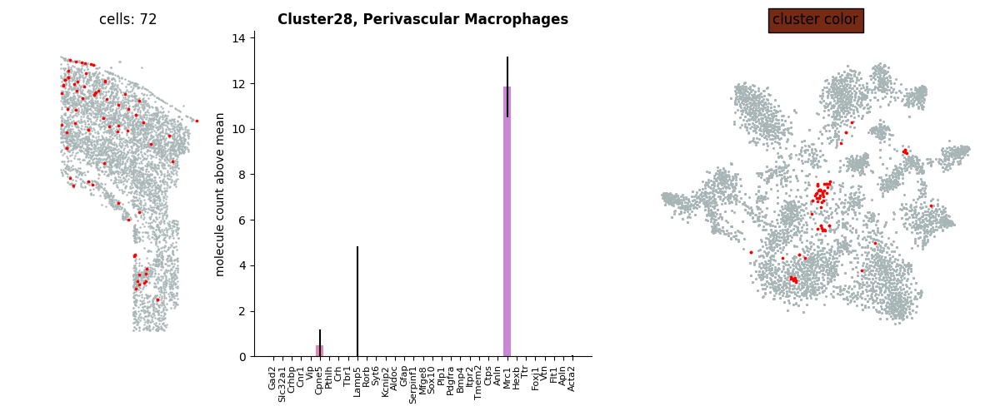

<IPython.core.display.Javascript object>


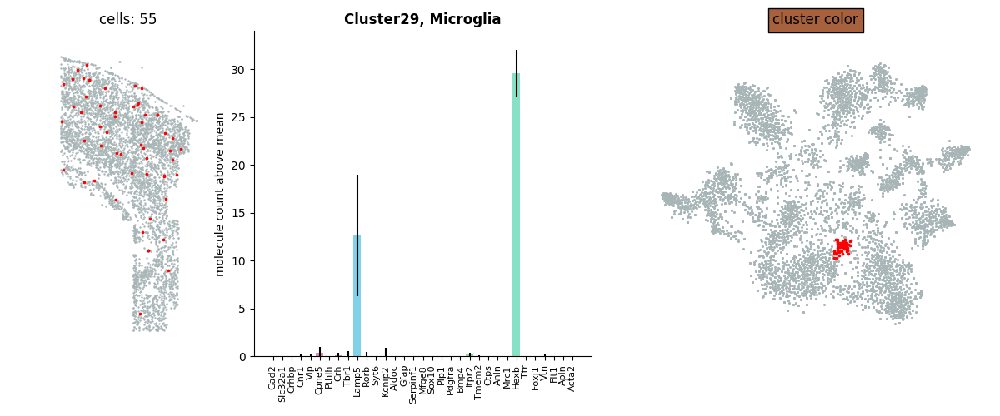

<IPython.core.display.Javascript object>


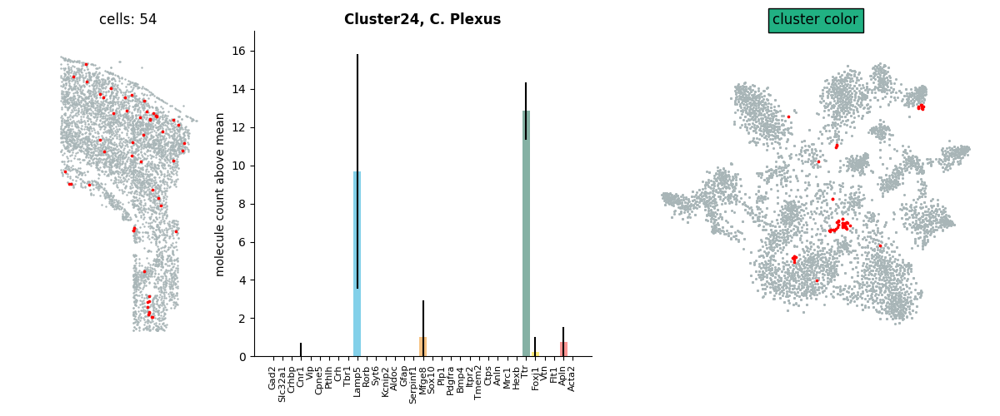

<IPython.core.display.Javascript object>


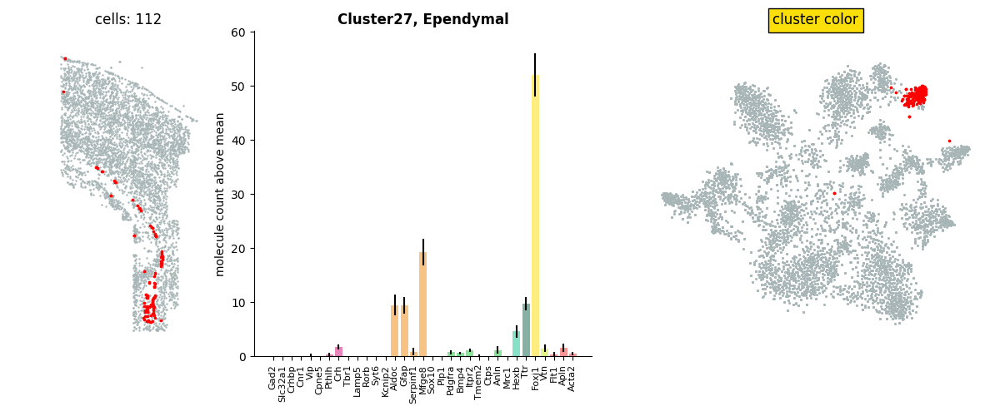

<IPython.core.display.Javascript object>


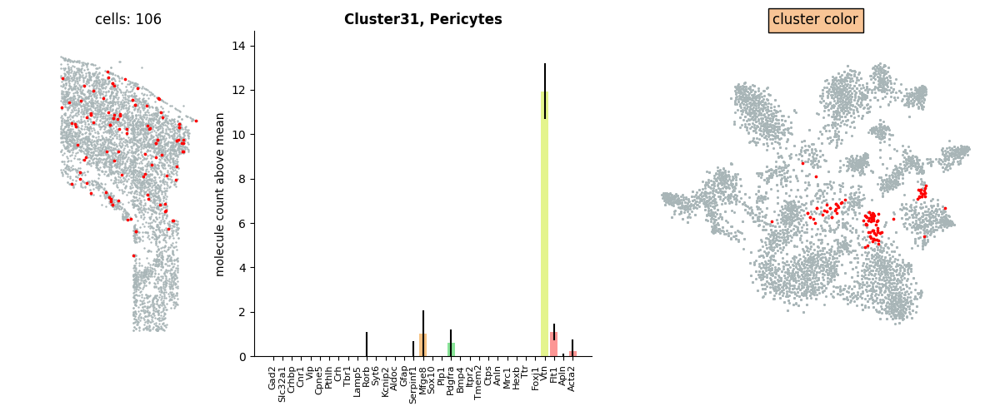

<IPython.core.display.Javascript object>


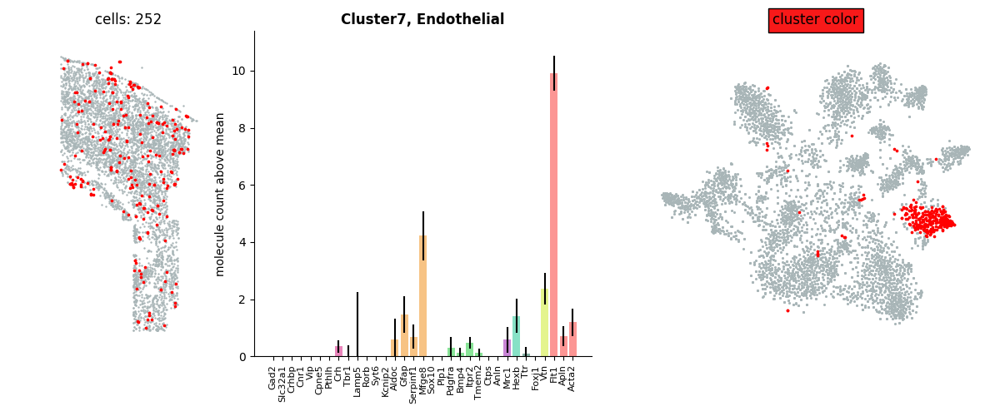

<IPython.core.display.Javascript object>


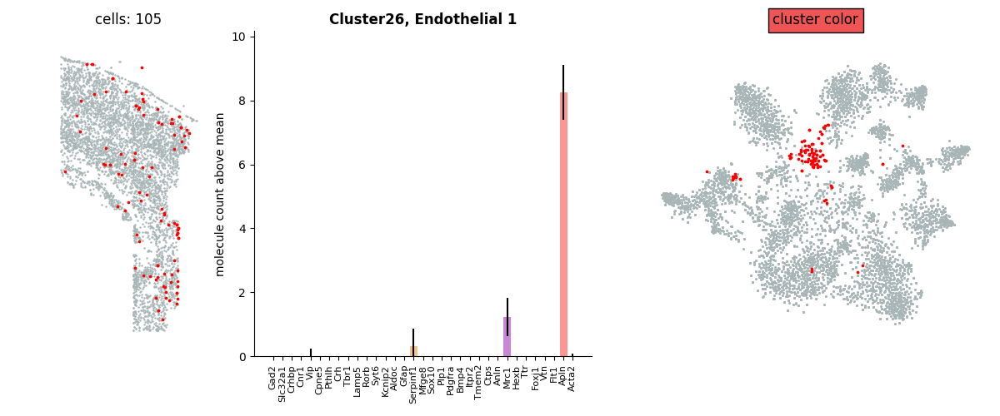

<IPython.core.display.Javascript object>


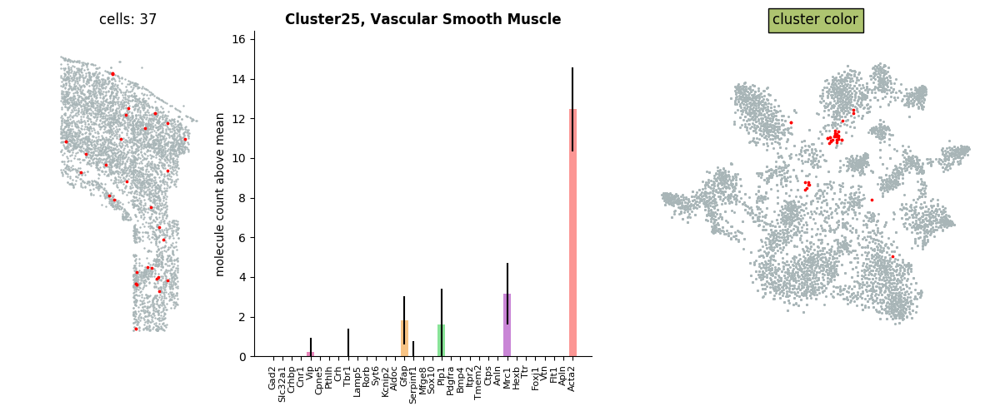

In [466]:
def plot_clusters(df, df_tSNE, labels, clusters=cluster_sort, save=False):

    if clusters == None:
        clusters=np.unique(labels)
    
    coord = coord_df.loc[:,df.columns]
    for i in clusters:
        fig = plt.figure(figsize=(12,5))

        ax1 = plt.subplot2grid((1,5), (0,0), rowspan=1, colspan=1)
        ax1.scatter(coord_df.loc['X',df.columns], coord_df.loc['Y',df.columns], linewidths=0, c=[168/255, 181/255, 183/255],  s=3)
        filt = labels == i
        ax1.set_title('cells: {}'.format(Counter(filt)[1]))
        ax1.scatter(coord.loc['X',filt], coord.loc['Y',filt], linewidths=0, c='red', s=7)
        ax1.invert_xaxis()
        ax1.invert_yaxis()
        ax1.set_axis_off()
        ax1.axis('equal')
        ax1.set_xlim([coord_df.loc['X', df.columns].max(), coord_df.loc['X',df.columns].min()])
        ax1.set_ylim([coord_df.loc['Y', df.columns].max(), coord_df.loc['Y', df.columns].min()])

        data = df_fish.loc[:,df.columns]
        data = data.loc[:,filt]
        gene_colors =   ['#d40d79', '#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79',
        '#07a2d5','#07a2d5','#07a2d5','#07a2d5','#07a2d5',
        '#f1880b','#f1880b','#f1880b','#f1880b',
        '#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33',
        '#950cae', '#11c48f',
        '#0c644a', '#ffde00',
        '#cbeb1c', '#fa2e2b', '#fa2e2b', '#fa2e2b']

        '''['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
            'green', 'green', 'green', 'green', 'green',  'green', 'green', 'green', 'green',
            'lightblue', 'lightblue', 'darkblue', 'orange','darkred','red','lightgreen','red']'''
        left_pos = range(data.shape[0])

        ax2 = plt.subplot2grid((1,5), (0,1), rowspan=1, colspan=2)
        exp_to_plot = (data.mean(axis=1) - df_fish.mean(axis=1))
        ax2.bar(left_pos, exp_to_plot, color=gene_colors, alpha=0.5, yerr=data.sem(axis=1)) 
        x_lab = [i.split('_')[1] for i in list(df_fish_totmol.index)]
        ax2.set_xticks(left_pos)
        ax2.set_xticklabels(x_lab, rotation='vertical', fontsize=8)
        ax2.set_ylim(0)
        ax2.spines['right'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        ax2.yaxis.set_ticks_position('left')
        ax2.xaxis.set_ticks_position('bottom')
        ax2.set_ylabel('molecule count above mean')
        plt.title('Cluster{}, {}'.format(i, cluster_names[i]), weight='bold')

        ax3 = plt.subplot2grid((1,5), (0,3), rowspan=1, colspan=2)
        ax3.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], c=[168/255, 181/255, 183/255], lw=0, s=5)
        #points_of_cluster = tSNE_points[labels_a == i]
        plt.scatter(df_tSNE.loc['tSNE1', filt], df_tSNE.loc['tSNE2', filt],c='red', lw=0, alpha=1, s=7)
        ax3.set_axis_off()
        ax3.axis('equal')
        ax3.set_title('cluster color', bbox={'facecolor':cluster_colors[i]})

        plt.tight_layout()
        if save == True:
            plt.savefig('Clusters/{}_{}.png'.format(i, cluster_names[i]), dpi=300)
        
plot_clusters(df_fish_totmol_clean, df_tSNE_points, labels_a, save=True)     #df_tSNE_points_clean   


In [ ]:
def compare_merge(df, labels, l, expression_threshold):
    mean_df = mean_expression(df, labels)
    for i in l:
        print('{}\n{}'.format(i , mean_df.loc[mean_df.loc[:,i]>expression_threshold, i]))

        
    for i in itertools.combinations(l, 2):
        print('\nmerging: {}'.format(i))
        print('Correlation: {}'.format(mean_df.corr().loc[i[0], i[1]]))
        
        df1 = df.loc[:, labels == i[0]]
        df2 = df.loc[:, labels == i[1]]
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
        
        enriched = set(enriched_df1 + enriched_df2)
        for i in enriched:
            print('{} {}'.format(i, scipy.stats.mannwhitneyu(df1.loc[i], df2.loc[i], alternative='two-sided')[1]))


compare_merge(df_fish_totmol, labels_a, [13, 21], 300)
#compare_merge(df_fish_totmol, labels_a, [7,20,21], 300)

In [422]:
for i in cluster_sort:
    print('{} {}'.format(cluster_colors[i], cluster_names_short[i]))

#9b067d Inh CP
#9805cc Inhib Crhbp
#ca4479 Inhib Cnr1
#ff49b0 Inhib IC
#af7efe Inhib Kcnip2
#4e14a6 Inhib Pthlh
#7759a4 Inhib Vip
#3e4198 Cpne5
#0ab4e4 Pyl L2-3
#1e6a87 Py L2-3 L5
#6787d6 Py Kcnip2
#004dba Pyl L3-4
#78edff py L4
#0a9fb4 Py L5
#027fd0 Py L6
#004b71 Hippocampus
#de4726 Astro Gfap
#f69149 Astro Mfge8
#b3ee3d OPC
#5dd73d Oligo COP
#64a44e Oligo NF
#2f7449 Oligo MF
#285528 Oligo Mature
#762a14 PVM
#a7623d Microglia
#21b183 C. Plexus
#fadf0b Ependymal
#f8c495 Pericytes
#f81919 Endothelial
#f05556 Endothelial 1
#aec470 VSM


In [424]:
cluster_names = {
    18 : 'Inhibitory CP',
    17 : 'Inhibitory Crhbp',
    14 : 'Inhibitory Cnr1',
    19 : 'Inhibitory IC',
    15 : 'Inhibitory Kcnip2',
    16 : 'Inhibitory Pthlh',
    20 : 'Inhibitory Vip',
     9 : 'Pyramidal Cpne5',
     8 : 'Pyramidal L2-3',
    10 : 'Pyramidal L2-3 L5',
     6 : 'Pyramidal Kcnip2',
     5 : 'Pyramidal L3-4',
     4 : 'Pyramidal L4',
    12 : 'Pyramidal L5',
     1 : 'Pyramidal L6',
    13 : 'Hippocampus',
     3 : 'Astrocyte Gfap',
     2 : 'Astrocyte Mfge8',
    32 : 'Oligodendrocyte Precursor cells',
    33 : 'Oligodendrocyte COP',
    30 : 'Oligodendrocyte NF',
    22 : 'Oligodendrocyte MF',
    21 : 'Oligodendrocyte Mature',
    28 : 'Perivascular Macrophages',
    29 : 'Microglia',
    24 : 'C. Plexus',
    27 : 'Ependymal',
    31 : 'Pericytes',
     7 : 'Endothelial',
    26 : 'Endothelial 1',
    25 : 'Vascular Smooth Muscle'}

cluster_names_short = {
    18 : 'Inh CP',
    17 : 'Inhib Crhbp',
    14 : 'Inhib Cnr1',
    19 : 'Inhib IC',
    15 : 'Inhib Kcnip2',
    16 : 'Inhib Pthlh',
    20 : 'Inhib Vip',
     9 : 'Py Cpne5',
     8 : 'Py L2-3',
    10 : 'Py L2-3 L5',
     6 : 'Py Kcnip2',
     5 : 'Pyl L3-4',
     4 : 'Py L4',
    12 : 'Py L5',
     1 : 'Py L6',
    13 : 'Hippocampus',
     3 : 'Astro Gfap',
     2 : 'Astro Mfge8',
    32 : 'OPC',
    33 : 'Oligo COP',
    30 : 'Oligo NF',
    22 : 'Oligo MF',
    21 : 'Oligo Mature',
    28 : 'PVM',
    29 : 'Microglia',
    24 : 'C. Plexus',
    27 : 'Ependymal',
    31 : 'Pericytes',
     7 : 'Endothelial',
    26 : 'Endothelial 1',
    25 : 'VSM'}

In [ ]:
major_clusters = {
    'Inhibitory' : [47,66,68,69,73,78,85,86,93],
    'Excitatory' : [21,54,55,79,87,90,91],
    'Astrocytes' : [62,63],
    'Oligodendrocytes' : [17,41,43,61,94],
    'PVM-VSM' : [83],
    'Microglia': [75],
    'Choroid plexus' : [81],
    'Ependimal' : [27],
    'Pericytes' : [37],
    'Endothelial' : [92, 89]
}

major_cluster_colors = {
    'Inhibitory' : '#d40d79',
    'Excitatory' : '#07a2d5',
    'Astrocytes' : '#f1880b',
    'Oligodendrocytes' : '#15cb33',
    'PVM-VSM' : '#950cae',
    'Microglia': '#11c48f',
    'Choroid plexus' : '#0c644a',
    'Ependimal' : '#ffde00',
    'Pericytes' : '#cbeb1c',
    'Endothelial' : '#fa2e2b' 
}

In [425]:
cluster_colors = {
    18 : '#9b067d',
    17 : '#9805cc',
    14 : '#ca4479',
    19 : '#ff49b0',
    15 : '#af7efe',
    16 : '#4e14a6',
    20 : '#7759a4',
     9 : '#3e4198',
     8 : '#0ab4e4',
    10 : '#1e6a87',
     6 : '#6787d6',
     5 : '#004dba',
     4 : '#78edff',
     1 : '#027fd0',
    13 : '#004b71',
    12 : '#0a9fb4',
     3 : '#de4726',
     2 : '#f69149',
    32 : '#b3ee3d',
    33 : '#5dd73d',
    30 : '#64a44e',
    22 : '#2f7449',
    21 : '#285528',
    28 : '#762a14',
    29 : '#a7623d',
    24 : '#21b183',
    27 : '#fadf0b',
    31 : '#f8c495',
     7 : '#f81919',
    26 : '#f05556',
    25 : '#aec470',
    
    11: '#6c6b6b',
    23: '#6c6b6b',
}

<IPython.core.display.Javascript object>


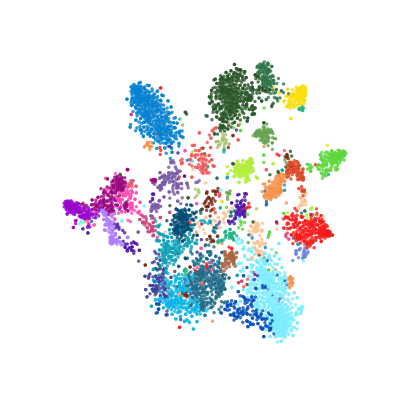

In [486]:
def plot_tSNE_clusters(df, df_tSNE, labels_a, save=False, name=None):
    plt.figure(figsize=(4, 4))
    plt.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], s=6, alpha=0.8, lw=0,
               c= [cluster_colors[i] for i in labels_a])
    plt.gca().set_axis_off()
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)

plot_tSNE_clusters(df_fish_totmol_clean, df_tSNE_points, labels_a, save=False, name='tSNE_31cl_totmol')

In [ ]:
plt.figure(figsize=(10,10))
color_labels_sort =[cluster_colors[i] for i in labels_a]
plt.scatter(coord_df.loc['X',df_fish_totmol_clean.columns], coord_df.loc['Y',df_fish_totmol_clean.columns], linewidths=0, c=color_labels_sort, s=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
plt.gca().set_axis_off()

#plt.savefig('Centroid_cluster_colour.png', dpi=600)

# Cluster comparison

In [426]:
df_fish_mean = mean_expression(df_fish_totmol_clean.loc[:,df_fish_totmol_clean.columns], labels_a)
df_fish_mean = df_fish_mean.loc[gene_sort_fish]

In [427]:
#make list and array of cell type labels
sc_CO_labels = []
for i in df_CO_totmol.columns:
    sc_CO_labels.append(sc_cort_olig_label[i])
sc_CO_labels_a = np.array(sc_CO_labels)

df_sc_mean = mean_expression(df_CO_totmol, sc_CO_labels_a)
df_sc_mean = df_sc_mean.loc[gene_sort]

In [429]:
df_type_correlation = pd.DataFrame(data=np.zeros((len(cluster_sort),len(df_sc_mean.columns))), columns=type_sort_sc_cort, index=cluster_sort)
for i in df_type_correlation.index:
    df_type_correlation.loc[i] = [np.corrcoef(df_fish_mean.loc[:,i], df_sc_mean[x], )[0,1] for x in df_type_correlation.columns]

<IPython.core.display.Javascript object>


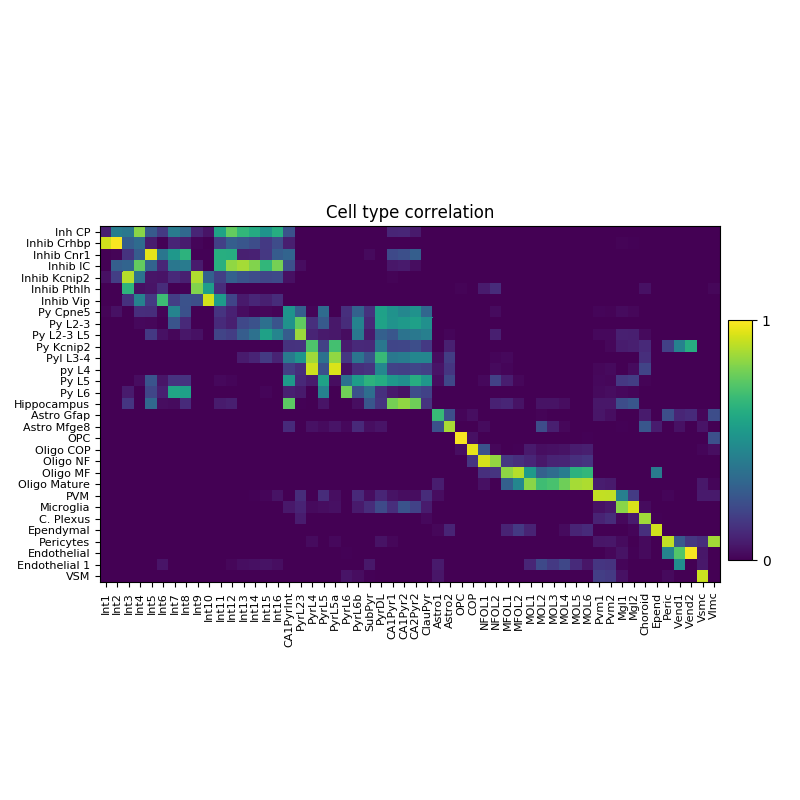

In [432]:
#Full correlation map

fig, ax = plt.subplots(figsize=(8,8))

corr_max = np.max(df_type_correlation.max(axis=0))
im = ax.pcolor(df_type_correlation, cmap='viridis', vmin=0, vmax=1)


y_pos = np.arange(len(df_type_correlation.index))
x_pos = np.arange(len(df_type_correlation.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names_short[i] for i in df_type_correlation.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Cell type correlation')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df_type_correlation.index)))
ax.set_xlim((0,len(df_type_correlation.columns)))
ax.invert_yaxis()
#plt.tight_layout()

#plt.savefig('Cell_type_correlation_totmol_Pearson_180220.svg')

<IPython.core.display.Javascript object>


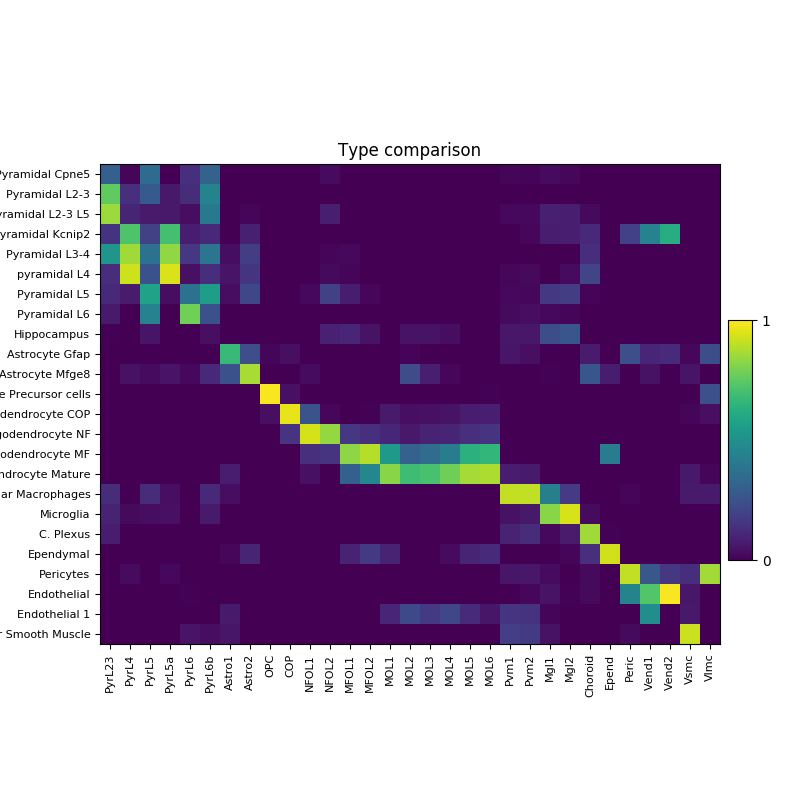

In [465]:
#Figure (Excluding interneurons and hippocampal)

fig, ax = plt.subplots(figsize=(8,8))

type_sort_sc_cort_trimmed = ['S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6', 'S1PyrL6b',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'PPR']

type_sort_sc_cort_trimmed_corrected= ['PyrL23', 'PyrL4', 'PyrL5', 'PyrL5a', 'PyrL6', 'PyrL6b',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'Vlmc']

type_sort_fish_trimmed = [9,8,10,6,5,4,12,1,13,
                3,2,
                32,33,30,22,21,
                28,29,24,27,31,7,26,25]

df = df_type_correlation.loc[type_sort_fish_trimmed, type_sort_sc_cort_trimmed]

im = ax.pcolor(df, cmap='viridis', vmin=0, vmax=1)

y_pos = np.arange(len(df.index))
x_pos = np.arange(len(df.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_trimmed_corrected, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names[i] for i in df.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Type comparison')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df.index)))
ax.set_xlim((0,len(df.columns)))
ax.invert_yaxis()
#plt.tight_layout()

#plt.savefig('Cell_type_correlation_Figure_totmol_Pearson_180220.svg')

In [436]:
for i in type_sort_fish_trimmed:
    print(cluster_names_short[i])

Py Cpne5
Py L2-3
Py L2-3 L5
Py Kcnip2
Pyl L3-4
py L4
Py L5
Py L6
Hippocampus
Astro Gfap
Astro Mfge8
OPC
Oligo COP
Oligo NF
Oligo MF
Oligo Mature
PVM
Microglia
C. Plexus
Ependymal
Pericytes
Endothelial
Endothelial 1
VSM


In [ ]:
#Supplemental (Interneurons)

fig, ax = plt.subplots(figsize=(8,8))

type_sort_sc_cort_trimmed2 = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',

'SubPyr', 'S1PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA1PyrInt', 'CA2Pyr2','ClauPyr',
]

type_sort_sc_cort_corrected_trimmed2 = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'SubPyr', 'PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA1PyrInt', 'CA2Pyr2','ClauPyr',]



type_sort_fish_trimmed2 = [66,68,69,93,78,85,47,73,
              79]

df = df_type_correlation.loc[type_sort_fish_trimmed2, type_sort_sc_cort_trimmed2]

im = ax.pcolor(df, cmap='viridis', vmin=0, vmax=1)

y_pos = np.arange(len(df.index))
x_pos = np.arange(len(df.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected_trimmed2, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names[i] for i in df.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Type comparison')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df.index)))
ax.set_xlim((0,len(df.columns)))
ax.invert_yaxis()
#plt.tight_layout()

plt.savefig('Cell_type_correlation_Supplemental_totmol_Pearson.svg')

## Best match gene count comparison

In [ ]:
best_matches = [[93,'Int2','Gad2','Slc32a1','Crhbp'],
                [47,'Int3','Gad2','Slc32a1','Pthlh', 'Kcnip2'],
                [78,'Int5','Gad2','Slc32a1','Cnr1'],
                [85,'Int6','Gad2','Slc32a1','Vip'],
                [47,'Int9','Gad2','Slc32a1','Pthlh', 'Kcnip2'],
                [73,'Int10','Gad2','Slc32a1','Vip', 'Crh'],
                [54,'S1PyrL23','Lamp5'],
                [90,'S1PyrL4', 'Rorb'],
                [91,'S1PyrL6','Tbr1','Syt6'],
                [79,'CA1Pyr2', 'Kcnip2'],
                [63,'Astro1','Gfap'],
                [62,'Astro2','Mfge8'],
                [43,'OPC','Sox10','Pdgfra'],
                [17,'COP','Sox10','Bmp4'],
                [61,'NFOL1','Itpr2','Tmem2'],
                [41,'MFOL2','Sox10','Ctps'],
                [94,'MOL6','Sox10','Anln'],
                [83,'Pvm2','Mrc1'],
                [75,'Mgl2','Hexb'],
                [37,'Peric','Vtn'],
                [92,'Vend2','Flt1']] #[81,'Choroid','Ttr'],


best_matches2 = [[93,'Int2','Gad2','Slc32a1','Crhbp'],
                [47,'Int3','Gad2','Slc32a1','Pthlh', 'Kcnip2'],
                [78,'Int5','Gad2','Slc32a1'],
                [85,'Int6','Gad2','Slc32a1',],
                [47,'Int9','Gad2','Slc32a1','Pthlh', 'Kcnip2'],
                [73,'Int10','Gad2','Slc32a1'],
                [54,'S1PyrL23','Lamp5'],
                [90,'S1PyrL4', 'Rorb'],
                [91,'S1PyrL6','Tbr1','Syt6'],
                [79,'CA1Pyr2', 'Kcnip2'],
                [63,'Astro1','Gfap'],
                [62,'Astro2','Mfge8'],
                [43,'OPC','Sox10','Pdgfra'],
                [17,'COP','Sox10','Bmp4'],
                [61,'NFOL1','Itpr2','Tmem2'],
                [41,'MFOL2','Sox10','Ctps'],
                [94,'MOL6','Sox10','Anln'],
                [83,'Pvm2','Mrc1'],
                [75,'Mgl2','Hexb'],
                [37,'Peric','Vtn'],
                [92,'Vend2','Flt1']]

In [ ]:
plt.figure(figsize=(10,10))
for i in best_matches2:
    filt_fish = labels_a == i[0]
    filt_sc = np.array([sc_cort_olig_label[l] for l in df_sc_cort_olig.columns]) == i[1]
    
    for g in i[2:]:
        data_fish = df_fish.loc[gene_name_conversion[g], filt_fish]
        data_sc = df_sc_cort_olig.loc[g, filt_sc]
        plt.scatter(np.mean(data_fish), np.mean(data_sc))
        plt.errorbar(np.mean(data_fish), np.mean(data_sc), xerr = scipy.stats.sem(data_fish), yerr=scipy.stats.sem(data_sc))
        plt.text(np.mean(data_fish)+0.2, np.mean(data_sc)+0.2, g, fontsize=8)
        if np.mean(data_sc) > 100:
            print(g, np.mean(data_sc))
            
ax = plt.gca()            
ax.plot([0,45],[0,45])  
ax.set_ylabel('Single Cell')
ax.set_xlabel('smFISH')

# Loom packaging

In [488]:
channels = [['Hybridization1_Foxj1','Hybridization2_Gfap','Hybridization3_Mfge8','Hybridization5_Cpne5', 
            'Hybridization6_Itpr2','Hybridization7_Ctps','Hybridization8_Pdgfra','Hybridization9_Lamp5','Hybridization10_Crh',
            'Hybridization11_Syt6','Hybridization12_Kcnip2','Hybridization13_Cnr1'],
           ['Hybridization1_Aldoc','Hybridization2_Flt1','Hybridization3_Hexb',
              'Hybridization6_Bmp4','Hybridization7_Rorb','Hybridization8_Pthlh','Hybridization10_Crhbp',
              'Hybridization11_Tmem2','Hybridization12_Slc32a1','Hybridization13_Plp1'],
           ['Hybridization1_Tbr1','Hybridization2_Gad2','Hybridization3_Mrc1','Hybridization5_Acta2',
            'Hybridization6_Vip','Hybridization7_Sox10','Hybridization8_Serpinf1','Hybridization9_Anln','Hybridization10_Apln',
            'Hybridization12_Vtn','Hybridization13_Ttr']]
channel_names = {0:'Cy3', 1:'CALFluorRed610', 2:'Cy5'}

gene_channel = {}
for n,i in enumerate(channels):
    for g in i:
        gene_channel[g] = channel_names[n]

In [494]:
#Packing the cleaned data.

filename = "osmFISH_SScortex_mouse_180220.loom"

#Sort the cells
cluster_sort = [18,17,14,19,15,16,20,
                9,8,10,6,5,4,12,1,13,
                3,2,
                32,33,30,22,21,
                28,29,24,27,31,7,26,25]
cell_ordered = sum([label_cells[i] for i in cluster_sort], [])

#Translate the cell labels to sequential numbers
#label_conversion = {k:v for v,k in enumerate(np.unique(labels_a))}
#cell_class = [label_conversion[cell_labels[i]] for i in cell_ordered]

#Load region data
cell_labels_regions = pickle.load(open('cell_label_region_180220.p', 'rb'))
#Conversion dictionary for region names
region_anatomical_names = {
                            1:'Layer 6',
                            3:'Piz Layer 1',
                            4:'Layer 4',
                            5:'Layer 3-4',
                            8:'Layer 2-3 medial',
                            13:'Hippicampus',
                            18:'Internal Capsual Caudo Putamen',
                            21:'White matter',
                            27:'Ventricle',
                            34:'Layer 2-3 lateral',
                            35:'Layer 5',}

#use df_fish dataframe
matrix = df_fish.loc[:,cell_ordered]
#use only the gene name and not the hybridzation
#matrix.rename(index={k:(k.split('_')[1]) for k in matrix.index})
#matrix = matrix.values

row_attrs = {"Gene": np.array([i.split('_')[1] for i in matrix.index]),
             "Hybridization": np.array([int(i.split('_')[0][13:]) for i in gene_sort_fish]),
             "Fluorophore": np.array([gene_channel[i] for i in gene_sort_fish])
            }

col_attrs = {"CellID": np.array(cell_ordered),
             "X": -coord_df.loc['X',cell_ordered].values + coord_df.loc['X',cell_ordered].max(),
             "Y": -coord_df.loc['Y',cell_ordered].values + coord_df.loc['Y',cell_ordered].max(),
             "ClusterID": labels_a,
             "ClusterName":np.array([cluster_names[cell_labels[i]] for i in cell_ordered]),
             "_tSNE_1": df_tSNE_points.loc['tSNE1', cell_ordered].values,
             "_tSNE_2": df_tSNE_points.loc['tSNE2', cell_ordered].values,
             "Region": np.array([region_anatomical_names[cell_labels_regions[i]] for i in cell_ordered]),
             "size_um2": np.array([cell_size[i] for i in cell_ordered]),
             "size_pix": np.array([cell_size_pix[i] for i in cell_ordered]),
             "Total_molecules": np.array(matrix.sum())}

loompy.create(filename, matrix.values, row_attrs, col_attrs)

In [504]:
#Packing all data
filename_full = "osmFISH_SScortex_mouse_raw_180220.loom"

#Sort the cells
cluster_sort = [18,17,14,19,15,16,20,
                9,8,10,6,5,4,12,1,13,
                3,2,
                32,33,30,22,21,
                28,29,24,27,31,7,26,25]
cell_ordered = sum([label_cells[i] for i in cluster_sort], [])
#Add all excluded cells
cell_ordered_full = cell_ordered.copy()
cell_ordered_full.extend([i for i in ds.ca.CellID if i not in cell_ordered])
n_excluded = len(cell_ordered_full) - len(cell_ordered)

#Translate the cell labels to sequential numbers
#label_conversion = {k:v for v,k in enumerate(np.unique(labels_a))}
#cell_class_full = [label_conversion[cell_labels[i]] for i in cell_ordered_full[:len(cell_ordered)]]
cell_class_full = list(labels_a)
cell_class_full.extend([-1] * n_excluded)

#Cluster names
cluster_names_full = [cluster_names[cell_labels[i]] for i in cell_ordered]
cluster_names_full.extend(['Excluded'] * n_excluded)


#Load region data
cell_labels_regions = pickle.load(open('cell_label_region_180220.p', 'rb'))
#Conversion dictionary for region names
region_anatomical_names = { 1:'Layer 6',
                            3:'Piz Layer 1',
                            4:'Layer 4',
                            5:'Layer 3-4',
                            8:'Layer 2-3 medial',
                            13:'Hippicampus',
                            18:'Internal Capsual Caudo Putamen',
                            21:'White matter',
                            27:'Ventricle',
                            34:'Layer 2-3 lateral',
                            35:'Layer 5',}

region_label_full = [region_anatomical_names[cell_labels_regions[i]] for i in cell_ordered]
region_label_full.extend(['Excluded'] * n_excluded) 

#use original loom file, include all cells
file_name_l = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds_l = loompy.connect(file_name_l)
matrix_full = df_fish_full = loompy2data(ds_l, 0, np.inf, 0)
matrix_full = matrix_full.loc[gene_sort_fish, cell_ordered_full]

#Cell coordinates
coord_df_full = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T

#tSNE data
tSNE1 = df_tSNE_points.loc['tSNE1', cell_ordered].values
tSNE1= np.append(tSNE1, [0]*n_excluded)
tSNE2 = df_tSNE_points.loc['tSNE2', cell_ordered].values
tSNE2 = np.append(tSNE2, [0]*n_excluded)

#Valid cells
valid = np.append(np.ones((len(cell_ordered)),dtype=int), np.zeros(n_excluded, dtype=int))


row_attrs = {"Gene": np.array([i.split('_')[1] for i in matrix_full.index]),
             "Hybridization": np.array([int(i.split('_')[0][13:]) for i in gene_sort_fish]),
             "Fluorophore": np.array([gene_channel[i] for i in gene_sort_fish])}

col_attrs = {"CellID": np.array(cell_ordered_full),
             "X": -coord_df_full.loc['X',cell_ordered_full].values + coord_df.loc['X',cell_ordered_full].max(),
             "Y": -coord_df_full.loc['Y',cell_ordered_full].values + coord_df.loc['Y',cell_ordered_full].max(),
             "ClusterID": np.array(cell_class_full),
             "ClusterName":np.array(cluster_names_full),
             "_tSNE_1": tSNE1,
             "_tSNE_2": tSNE2,
             "Region": np.array(region_label_full),
             "size_um2": np.array([cell_size[i] for i in cell_ordered_full]),
             "size_pix": np.array([cell_size_pix[i] for i in cell_ordered_full]),
             "Total_molecules": np.array(matrix_full.sum()),
             "Valid": valid}

loompy.create(filename_full, matrix_full.values, row_attrs, col_attrs)

Selected cells with  0>size<inf and a minimum molecule count of 0 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
counters: size0, molecules0


In [503]:
for c n col_attrs.keys():
    print(col_attrs[c].shape, c)

(6471,) CellID
(6471,) X
(6471,) Y
(9735,) ClusterID
(6471,) ClusterName
(6471,) _tSNE_1
(6471,) _tSNE_2
(6471,) Region
(6471,) size_um2
(6471,) size_pix
(6471,) Total_molecules
(6471,) Valid


In [500]:
ds_l

,CellArea,23939.0,13532.0,28819.0,40777.0,16303.0,9065.0,23155.0,44564.0,18963.0,19373.0,...
,CellID,1124,2325,2400,241,6248,5992,275,2573,330,1149,...
genes,,,,,,,,,,,,...
Hybridization1_Tbr1,,13.0,11.0,28.0,12.0,7.0,6.0,14.0,24.0,5.0,3.0,...
Hybridization1_Aldoc,,38.0,0.0,9.0,5.0,38.0,2.0,4.0,3.0,7.0,10.0,...
Hybridization1_Foxj1,,0.0,0.0,0.0,1.0,5.0,0.0,3.0,1.0,1.0,1.0,...
Hybridization6_Bmp4,,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...
Hybridization6_Itpr2,,4.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,1.0,...
Hybridization6_Vip,,13.0,1.0,2.0,4.0,30.0,1.0,3.0,2.0,1.0,4.0,...
Hybridization4_Cnr1,,0.0,0.0,0.0,0.0,65.0,5.0,0.0,0.0,0.0,0.0,...
Hybridization4_Plp1,,16.0,0.0,0.0,0.0,8.0,0.0,0.0,6.0,0.0,0.0,...


In [ ]:
def dispatch_dict(operator, x, y):
    return {
        'add': lambda: x + y,
        'sub': lambda: x - y,
        'mul': lambda: x * y,
        'div': lambda: x / y,
    }.get(operator)()

In [ ]:
dispatch_dict('add', 3,4)

In [ ]:
g = lambda x,y: x*y
g(5,5)

# Tissue Regions
moved to "Neigbours_area_classification" notebook

In [ ]:
cell_labels_regions = pickle.load(open('cell_label_region.p', 'rb'))

def plot_area_content(ax, cell_labels_regions, area_of_interest, type_color, percentage_show):
    #Get cells into a dictionary per region
    """region_cells = {}
    for i in np.unique(tissue_pattern):
        region_cells[i] = []
    for c in cell_grid.columns:
        reg = tissue_pattern[cell_grid[c]['Y']-1, cell_grid[c]['X']-1]
        region_cells[reg].append(c)"""

    region_cells = {}
    for l in np.unique(list(cell_labels_regions.values())):
        region_cells[l] = []

    for k,v in cell_labels_regions.items():
        region_cells[v].append(k)

    #substitute the cells for their cell label
    region_types = {}
    for k in region_cells:
        region_types[k] =[cell_labels[i] for i in region_cells[k]]
        
    region = region_types[area_of_interest]
    c = Counter(region)
    print(c)
    percentage = np.array([(i, c[i] / len(region) * 100.0) for i in c])

    type_color_list = [type_color[i] for i in percentage[:,0]]
    #for n, i in enumerate(type_color_list):
    #    type_color_list[n] = [i[0]/255, i[1]/255, i[2]/255]

    pie_labels = []
    for i in percentage:
        if i[1] > percentage_show:
            pie_labels.append(cluster_names[i[0]])
        else:
            pie_labels.append('')

    '''pie_percentage = []
    for i in percentage:
        if i[1] > 5:
            pie_percentage.append(i[1])
        else:
            pie_percentage.append('')'''

    def my_autopct(pct):
        return ('%.0f%%' % pct) if pct > percentage_show else ''
    patches, texts, autotexts = ax.pie(percentage[:,1], colors=type_color_list, labels=pie_labels, autopct=my_autopct)
    for i in texts:
        i.set_fontsize(14)
    for i in autotexts:
        i.set_fontsize(12)
    ax.set_aspect('equal')   
    ax.set_title('{} cells'.format(len(region)), fontsize = 16)
    
    


In [ ]:
for i in np.unique(list(cell_labels_regions.values())):
    fig, ax = plt.subplots(figsize=(8,4))
    plot_area_content(ax, cell_labels_regions, i, cluster_colors, percentage_show=3)
    plt.tight_layout()
    plt.savefig('tissue_region_content/region_{}.png'.format(i), dpi=300)

## Lamp5 Mfge8

In [ ]:
[True  if i in lables_a else False for i in [55,13,45,62]]

In [ ]:
plt.figure(figsize=(10,10))
filt = [True  if i in [55,13,45,62] else False for i in labels_a]

df_to_use = df_fish_totmol_clean.loc[:,filt]

labels_to_use = labels_a[filt]


color_labels_sort =[cluster_colors[i] for i in labels_to_use]
plt.scatter(coord_df.loc['X',df_to_use.columns], coord_df.loc['Y',df_to_use.columns], linewidths=0, c=color_labels_sort, s=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
plt.gca().set_axis_off()

In [ ]:
plt.figure(figsize=(10,10))
filt = [True  if i in [90,91,87,62] else False for i in labels_a]

df_to_use = df_fish_totmol_clean.loc[:,filt]

labels_to_use = labels_a[filt]

color_labels_sort =[cluster_colors[i] for i in labels_to_use]
plt.scatter(coord_df.loc['X',df_to_use.columns], coord_df.loc['Y',df_to_use.columns], linewidths=0, c=color_labels_sort, s=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
plt.gca().set_axis_off()

In [ ]:
len(filt)

In [ ]:
def post_merge(df, labels, post_merge_cutoff, linkage_method='single', linkage_metric='correlation', fcluster_criterion='distance'):
    """
    Merge clusters based on likage and a cutoff. The mean expression levels of 
    the clusters are linked and them merged based on the cutoff provided.
    Input:
    `df`(Pandas dataframe): df with expression matrix. row-genes, col-cells.
    `labels`(list/array): Labels of the cells.
    `post_merge_cutoff`(float): Merge clusters that have a distance from each 
        other below the cutoff.
    `linkage_method`(string): Scipy linkage methods. Default = 'single'
    `linkage_metric`(string): Scipy lingae metric. Default = 'correlation'
    `fcluster_criterion`(string): Scipy fcluster criterion. Default = 'distance'
    
    Returns:
    `new_labels`(list): List of new cell labels after merging. 
    Additionally it plots the dendrogram showing which clusters are merged.
        
    """
    #merge the labels based on parameters
    df_mean = mean_expression(df, labels)
    Z = scipy.cluster.hierarchy.linkage(df_mean.T, method=linkage_method, metric=linkage_metric)
    merged_labels_short = scipy.cluster.hierarchy.fcluster(Z, post_merge_cutoff, criterion=fcluster_criterion)

    #Update labels  
    label_conversion = dict(zip(df_mean.columns, merged_labels_short))
    label_conversion_r = dict(zip(merged_labels_short, df_mean.columns))
    new_labels = [label_conversion[i] for i in labels] 

    #Plot the dendrogram to visualize the merging
    fig, ax = plt.subplots()
    scipy.cluster.hierarchy.dendrogram(Z, labels=df_mean.columns ,color_threshold=post_merge_cutoff)
    ax.hlines(post_merge_cutoff, 0, ax.get_xlim()[1])
    ax.set_title('Merged clusters')
    ax.set_ylabel(linkage_metric)
    ax.set_xlabel('new cluster labels')
    
    print('Merged clusters. Started with {} clusters, merging results to {} clusters.'.format(
        len(np.unique(labels)), len(np.unique(merged_labels_short))))
    
    return new_labels
    